<a href="https://colab.research.google.com/github/NavyaKiran/Crime-Type-Prediction/blob/main/Project_Part_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install -U kaleido
#we require it to render plotly images on github

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 MB 8.9 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
lida 0.0.10 requires fastapi, which is not installed.
lida 0.0.10 requires python-multipart, which is not installed.
lida 0.0.10 requires uvicorn, which is not installed.


In [ ]:
import pandas as pd
import folium
import glob
from folium import plugins
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
import numpy as np

import plotly.io as pio
#I had to render images as a png because plotly figures were not displaying on the
#github notebook
import IPython.display as display
import kaleido
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from yellowbrick.cluster import KElbowVisualizer
from keras.utils import to_categorical
import warnings
warnings.filterwarnings("ignore")


#import the required packages

In [ ]:
crime = pd.read_csv('/content/drive/MyDrive/Crime_Data.csv')
#read in the required dataset

In [ ]:
crime.head()
#view the first few rows of the dataset

,DR_NO,Date Rptd,DATE OCC,TIME OCC,AREA,AREA NAME,Rpt Dist No,Part 1-2,Crm Cd,Crm Cd Desc,...,Status,Status Desc,Crm Cd 1,Crm Cd 2,Crm Cd 3,Crm Cd 4,LOCATION,Cross Street,LAT,LON
0,10304468,01/08/2020 12:00:00 AM,01/08/2020 12:00:00 AM,2230,3,Southwest,377,2,624,BATTERY - SIMPLE ASSAULT,...,AO,Adult Other,624.0,NaN,NaN,NaN,1100 W 39TH PL,NaN,34.0141,-118.2978
1,190101086,01/02/2020 12:00:00 AM,01/01/2020 12:00:00 AM,330,1,Central,163,2,624,BATTERY - SIMPLE ASSAULT,...,IC,Invest Cont,624.0,NaN,NaN,NaN,700 S HILL ST,NaN,34.0459,-118.2545
2,200110444,04/14/2020 12:00:00 AM,02/13/2020 12:00:00 AM,1200,1,Central,155,2,845,SEX OFFENDER REGISTRANT OUT OF COMPLIANCE,...,AA,Adult Arrest,845.0,NaN,NaN,NaN,200 E 6TH ST,NaN,34.0448,-118.2474
3,191501505,01/01/2020 12:00:00 AM,01/01/2020 12:00:00 AM,1730,15,N Hollywood,1543,2,745,VANDALISM - MISDEAMEANOR ($399 OR UNDER),...,IC,Invest Cont,745.0,998.0,NaN,NaN,5400 CORTEEN PL,NaN,34.1685,-118.4019
4,191921269,01/01/2020 12:00:00 AM,01/01/2020 12:00:00 AM,415,19,Mission,1998,2,740,"VANDALISM - FELONY ($400 & OVER, ALL CHURCH VA...",...,IC,Invest Cont,740.0,NaN,NaN,NaN,14400 TITUS ST,NaN,34.2198,-118.4468


In [ ]:
crime.columns
#columns in the dataset

Index(['DR_NO', 'Date Rptd', 'DATE OCC', 'TIME OCC', 'AREA', 'AREA NAME',
       'Rpt Dist No', 'Part 1-2', 'Crm Cd', 'Crm Cd Desc', 'Mocodes',
       'Vict Age', 'Vict Sex', 'Vict Descent', 'Premis Cd', 'Premis Desc',
       'Weapon Used Cd', 'Weapon Desc', 'Status', 'Status Desc', 'Crm Cd 1',
       'Crm Cd 2', 'Crm Cd 3', 'Crm Cd 4', 'LOCATION', 'Cross Street', 'LAT',
       'LON'],
      dtype='object')

In [ ]:
column_names = {
    'DR_NO': 'Report_Number',
    'Date Rptd': 'Date_Reported',
    'DATE OCC': 'Date_Occurred',
    'TIME OCC': 'Time_Occurred',
    'AREA': 'Area_Code',
    'AREA NAME': 'Area_Name',
    'Rpt Dist No': 'Reporting_District_Number',
    'Part 1-2': 'Crime_Classification',
    'Crm Cd': 'Crime_Code',
    'Crm Cd Desc': 'Crime_Description',
    'Mocodes': 'Modus_Operandi_Codes',
    'Vict Age': 'Victim_Age',
    'Vict Sex': 'Victim_Sex',
    'Vict Descent': 'Victim_Ethnicity',
    'Premis Cd': 'Premises_Code',
    'Premis Desc': 'Premises_Description',
    'Weapon Used Cd': 'Weapon_Code',
    'Weapon Desc': 'Weapon_Description',
    'Status': 'Case_Status',
    'Status Desc': 'Status_Description',
    'Crm Cd 1': 'Crime_Code_1',
    'Crm Cd 2': 'Crime_Code_2',
    'Crm Cd 3': 'Crime_Code_3',
    'Crm Cd 4': 'Crime_Code_4',
    'LOCATION': 'Location',
    'Cross Street': 'Cross_Street',
    'LAT': 'Latitude',
    'LON': 'Longitude'
}
#Applying the renaming to make it readable
crime = crime.rename(columns = column_names)

In [ ]:
crime.columns
#renamed columns in the dataset

Index(['Report_Number', 'Date_Reported', 'Date_Occurred', 'Time_Occurred',
       'Area_Code', 'Area_Name', 'Reporting_District_Number',
       'Crime_Classification', 'Crime_Code', 'Crime_Description',
       'Modus_Operandi_Codes', 'Victim_Age', 'Victim_Sex', 'Victim_Ethnicity',
       'Premises_Code', 'Premises_Description', 'Weapon_Code',
       'Weapon_Description', 'Case_Status', 'Status_Description',
       'Crime_Code_1', 'Crime_Code_2', 'Crime_Code_3', 'Crime_Code_4',
       'Location', 'Cross_Street', 'Latitude', 'Longitude'],
      dtype='object')

In [ ]:
crime.shape
#number of rows and columns in the dataset

(834320, 28)

In [ ]:
crime.isnull().sum()
#the number of null values in the dataset

Report_Number                     0
Date_Reported                     0
Date_Occurred                     0
Time_Occurred                     0
Area_Code                         0
Area_Name                         0
Reporting_District_Number         0
Crime_Classification              0
Crime_Code                        0
Crime_Description                 0
Modus_Operandi_Codes         115576
Victim_Age                        0
Victim_Sex                   109888
Victim_Ethnicity             109896
Premises_Code                    10
Premises_Description            499
Weapon_Code                  543395
Weapon_Description           543395
Case_Status                       0
Status_Description                0
Crime_Code_1                     10
Crime_Code_2                 772995
Crime_Code_3                 832249
Crime_Code_4                 834259
Location                          0
Cross_Street                 701184
Latitude                          0
Longitude                   

In [ ]:
#Getting rid of some unwanted columns
#most of them are filled with null values but there are other columns which are not used in
#our analysis process.
columns_to_remove = ['Crime_Code_1','Crime_Code_2', 'Crime_Code_3', 'Crime_Code_4', 'Cross_Street', 'Area_Code', 'Reporting_District_Number', 'Crime_Classification',
                     'Modus_Operandi_Codes', 'Premises_Code', 'Weapon_Code']
data = crime.drop(columns=columns_to_remove, errors = 'ignore')
data.head()

,Report_Number,Date_Reported,Date_Occurred,Time_Occurred,Area_Name,Crime_Code,Crime_Description,Victim_Age,Victim_Sex,Victim_Ethnicity,Premises_Description,Weapon_Description,Case_Status,Status_Description,Location,Latitude,Longitude
0,10304468,01/08/2020 12:00:00 AM,01/08/2020 12:00:00 AM,2230,Southwest,624,BATTERY - SIMPLE ASSAULT,36,F,B,SINGLE FAMILY DWELLING,"STRONG-ARM (HANDS, FIST, FEET OR BODILY FORCE)",AO,Adult Other,1100 W 39TH PL,34.0141,-118.2978
1,190101086,01/02/2020 12:00:00 AM,01/01/2020 12:00:00 AM,330,Central,624,BATTERY - SIMPLE ASSAULT,25,M,H,SIDEWALK,UNKNOWN WEAPON/OTHER WEAPON,IC,Invest Cont,700 S HILL ST,34.0459,-118.2545
2,200110444,04/14/2020 12:00:00 AM,02/13/2020 12:00:00 AM,1200,Central,845,SEX OFFENDER REGISTRANT OUT OF COMPLIANCE,0,X,X,POLICE FACILITY,NaN,AA,Adult Arrest,200 E 6TH ST,34.0448,-118.2474
3,191501505,01/01/2020 12:00:00 AM,01/01/2020 12:00:00 AM,1730,N Hollywood,745,VANDALISM - MISDEAMEANOR ($399 OR UNDER),76,F,W,"MULTI-UNIT DWELLING (APARTMENT, DUPLEX, ETC)",NaN,IC,Invest Cont,5400 CORTEEN PL,34.1685,-118.4019
4,191921269,01/01/2020 12:00:00 AM,01/01/2020 12:00:00 AM,415,Mission,740,"VANDALISM - FELONY ($400 & OVER, ALL CHURCH VA...",31,X,X,BEAUTY SUPPLY STORE,NaN,IC,Invest Cont,14400 TITUS ST,34.2198,-118.4468


In [ ]:
cols_to_replace = ['Weapon_Description', 'Premises_Description']
#replace the "na" values in Weapon_Description and Premises_Description with 'N/A'
for col in cols_to_replace:
  data[col] = data[col].fillna('N/A')

In [ ]:
# for col in ['Victim_Sex', 'Victim_Ethnicity']:
#   data[col] = data[col].fillna('Unknown')

In [ ]:
data.isna().sum()
#verify whether nulls have been handled for weapon description and premises description

Report_Number                0
Date_Reported                0
Date_Occurred                0
Time_Occurred                0
Area_Name                    0
Crime_Code                   0
Crime_Description            0
Victim_Age                   0
Victim_Sex              109888
Victim_Ethnicity        109896
Premises_Description         0
Weapon_Description           0
Case_Status                  0
Status_Description           0
Location                     0
Latitude                     0
Longitude                    0
dtype: int64

In [ ]:
data.info()
#view the description of the dataframe (non null count and data types)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 834320 entries, 0 to 834319
Data columns (total 17 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   Report_Number         834320 non-null  int64  
 1   Date_Reported         834320 non-null  object 
 2   Date_Occurred         834320 non-null  object 
 3   Time_Occurred         834320 non-null  int64  
 4   Area_Name             834320 non-null  object 
 5   Crime_Code            834320 non-null  int64  
 6   Crime_Description     834320 non-null  object 
 7   Victim_Age            834320 non-null  int64  
 8   Victim_Sex            724432 non-null  object 
 9   Victim_Ethnicity      724424 non-null  object 
 10  Premises_Description  834320 non-null  object 
 11  Weapon_Description    834320 non-null  object 
 12  Case_Status           834320 non-null  object 
 13  Status_Description    834320 non-null  object 
 14  Location              834320 non-null  object 
 15  

In [ ]:
data.describe()
#describe the statistical information of numerical columns

,Report_Number,Time_Occurred,Crime_Code,Victim_Age,Latitude,Longitude
count,8.343200e+05,834320.000000,834320.000000,834320.000000,834320.000000,834320.000000
mean,2.163756e+08,1335.953179,500.844621,29.782026,33.981070,-118.032961
std,1.090810e+07,653.964917,207.778540,21.782950,1.775627,6.156465
min,8.170000e+02,1.000000,110.000000,-3.000000,0.000000,-118.667600
25%,2.102104e+08,900.000000,331.000000,6.000000,34.013700,-118.429500
50%,2.201268e+08,1415.000000,442.000000,31.000000,34.058400,-118.321400
75%,2.220196e+08,1900.000000,626.000000,45.000000,34.163000,-118.273900
max,2.399165e+08,2359.000000,956.000000,120.000000,34.334300,0.000000


In [ ]:
data[['Time_Occurred', 'Victim_Age', 'Latitude', 'Longitude']].describe()
#numeric columns of importance
#As per the below results, we see that there are outliers in the victim's age
#The age includes a minimum of -3 and a maximum of 120.
#In order to overcome this, we make use of the IQR method to identify the first
#and third quantiles and ensure that age is within those limits

,Time_Occurred,Victim_Age,Latitude,Longitude
count,834320.000000,834320.000000,834320.000000,834320.000000
mean,1335.953179,29.782026,33.981070,-118.032961
std,653.964917,21.782950,1.775627,6.156465
min,1.000000,-3.000000,0.000000,-118.667600
25%,900.000000,6.000000,34.013700,-118.429500
50%,1415.000000,31.000000,34.058400,-118.321400
75%,1900.000000,45.000000,34.163000,-118.273900
max,2359.000000,120.000000,34.334300,0.000000


In [ ]:
data.duplicated().sum()
#duplicates in the dataframe

0

In [ ]:
def iqr_outlier_detection(data):
    Q1 = data.quantile(0.25)
    Q3 = data.quantile(0.75)
    IQR = Q3-Q1
    upper_bound = Q3 + 1.5 * IQR
    return upper_bound

upper_bound = iqr_outlier_detection(data['Victim_Age'])
print("The upper bound is", upper_bound)

#we use the IQR method in order to identify the upper bound of the data
#we keep the lower bound as 0 and hence we do not require the identification of the lower bound
#we then clip the data in order to represent

The upper bound is 103.5


In [ ]:
data = data[data['Victim_Age'].between(1, upper_bound, inclusive='both')]
#limit age to only those values between 1 and the upper bound (103.5)

In [ ]:
data['Victim_Age'].describe()
#The minimum age is 2 and maximum is 99

count    627912.000000
mean         39.571958
std          15.589914
min           2.000000
25%          28.000000
50%          37.000000
75%          50.000000
max          99.000000
Name: Victim_Age, dtype: float64

In [ ]:
data.shape
#number of rows in the dataframe

(627912, 17)

In [ ]:
data['Victim_Age'].describe()

count    627912.000000
mean         39.571958
std          15.589914
min           2.000000
25%          28.000000
50%          37.000000
75%          50.000000
max          99.000000
Name: Victim_Age, dtype: float64

In [ ]:
data['Crime_Description'].unique()
#What are the unique types of crimes in the dataset

array(['BATTERY - SIMPLE ASSAULT',
       'VANDALISM - MISDEAMEANOR ($399 OR UNDER)',
       'VANDALISM - FELONY ($400 & OVER, ALL CHURCH VANDALISMS)',
       'RAPE, FORCIBLE', 'SHOPLIFTING - PETTY THEFT ($950 & UNDER)',
       'THEFT-GRAND ($950.01 & OVER)EXCPT,GUNS,FOWL,LIVESTK,PROD',
       'BURGLARY FROM VEHICLE', 'CRIMINAL THREATS - NO WEAPON DISPLAYED',
       'INTIMATE PARTNER - SIMPLE ASSAULT',
       'THEFT PLAIN - PETTY ($950 & UNDER)', 'THEFT OF IDENTITY',
       'ROBBERY', 'ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT',
       'BURGLARY', 'BRANDISH WEAPON',
       'INTIMATE PARTNER - AGGRAVATED ASSAULT', 'BUNCO, GRAND THEFT',
       'THEFT, PERSON', 'BATTERY WITH SEXUAL CONTACT', 'BIKE - STOLEN',
       'LETTERS, LEWD  -  TELEPHONE CALLS, LEWD',
       'VIOLATION OF COURT ORDER', 'TRESPASSING',
       'THEFT FROM MOTOR VEHICLE - GRAND ($950.01 AND OVER)',
       'VIOLATION OF RESTRAINING ORDER', 'DISTURBING THE PEACE',
       'THEFT FROM MOTOR VEHICLE - PETTY ($950 & UNDE

In [ ]:
crime_mapping = {
    'Theft and Burglary': ['SHOPLIFTING - PETTY THEFT ($950 & UNDER)' , 'THEFT-GRAND ($950.01 & OVER)EXCPT,GUNS,FOWL,LIVESTK,PROD', 'BURGLARY FROM VEHICLE', 'ROBBERY', 'BURGLARY', 'BUNCO, GRAND THEFT' , 'THEFT, PERSON', 'BIKE - STOLEN', 'THEFT FROM MOTOR VEHICLE - GRAND ($950.01 AND OVER)', 'THEFT FROM MOTOR VEHICLE - PETTY ($950 & UNDER)', 'THEFT FROM MOTOR VEHICLE - ATTEMPT', 'ATTEMPTED ROBBERY', 'BUNCO, PETTY THEFT', 'SHOPLIFTING-GRAND THEFT ($950.01 & OVER)', 'PURSE SNATCHING', 'BURGLARY, ATTEMPTED','BUNCO, ATTEMPT', 'THEFT FROM PERSON - ATTEMPT','BURGLARY FROM VEHICLE, ATTEMPTED', 'PICKPOCKET', 'THEFT PLAIN - ATTEMPT', 'SHOPLIFTING - ATTEMPT', 'PURSE SNATCHING - ATTEMPT', 'THEFT, COIN MACHINE - GRAND ($950.01 & OVER)', 'PETTY THEFT - AUTO REPAIR', 'DISHONEST EMPLOYEE - PETTY THEFT', 'THEFT, COIN MACHINE - PETTY ($950 & UNDER)', 'TILL TAP - PETTY ($950 & UNDER)', 'THEFT, COIN MACHINE - ATTEMPT', 'PICKPOCKET, ATTEMPT', 'TILL TAP - GRAND THEFT ($950.01 & OVER)', 'DISHONEST EMPLOYEE ATTEMPTED THEFT', 'GRAND THEFT / AUTO REPAIR'],
    'Violent and Sexual Crimes': ['BATTERY - SIMPLE ASSAULT', 'RAPE, FORCIBLE' , 'INTIMATE PARTNER - SIMPLE ASSAULT', 'ASSAULT WITH DEADLY WEAPON' , 'AGGRAVATED ASSAULT', 'INTIMATE PARTNER - AGGRAVATED ASSAULT' , 'BATTERY WITH SEXUAL CONTACT' , 'SEX,UNLAWFUL(INC MUTUAL CONSENT, PENETRATION W/ FRGN OBJ', 'BOMB SCARE','SEXUAL PENETRATION W/FOREIGN OBJECT','SHOTS FIRED AT INHABITED DWELLING' , 'ORAL COPULATION', 'LEWD CONDUCT', 'SEX OFFENDER REGISTRANT OUT OF COMPLIANCE', 'SODOMY/SEXUAL CONTACT B/W PENIS OF ONE PERS TO ANUS OTH', 'ARSON', 'PIMPING', 'DISCHARGE FIREARMS/SHOTS FIRED', 'RAPE, ATTEMPTED', 'SHOTS FIRED AT MOVING VEHICLE, TRAIN OR AIRCRAFT', 'CRIMINAL HOMICIDE', 'HUMAN TRAFFICKING - COMMERCIAL SEX ACTS','PEEPING TOM', 'HUMAN TRAFFICKING - INVOLUNTARY SERVITUDE', 'LYNCHING - ATTEMPTED', 'WEAPONS POSSESSION/BOMBING', 'INCEST (SEXUAL ACTS BETWEEN BLOOD RELATIVES)', 'BEASTIALITY, CRIME AGAINST NATURE SEXUAL ASSLT WITH ANIM'],
    'Traffic and Vehicle Related Crimes': ['VEHICLE - ATTEMPT STOLEN', 'FAILURE TO YIELD', 'VEHICLE - STOLEN', 'DRIVING WITHOUT OWNER CONSENT (DWOC)', 'VEHICLE, STOLEN - OTHER (MOTORIZED SCOOTERS, BIKES, ETC)', 'MANSLAUGHTER, NEGLIGENT', 'BIKE - ATTEMPTED STOLEN', 'RECKLESS DRIVING'],
    'Miscellaneous Crimes': ['CRIMINAL THREATS - NO WEAPON DISPLAYED' , 'BRANDISH WEAPON','LETTERS, LEWD  -  TELEPHONE CALLS, LEWD',
'VIOLATION OF COURT ORDER', 'TRESPASSING', 'VIOLATION OF RESTRAINING ORDER', 'DISTURBING THE PEACE', 'OTHER MISCELLANEOUS CRIME', 'THROWING OBJECT AT MOVING VEHICLE', 'EXTORTION', 'OTHER ASSAULT', 'INDECENT EXPOSURE', 'VIOLATION OF TEMPORARY RESTRAINING ORDER', 'THREATENING PHONE , CALLS/LETTERS', 'UNAUTHORIZED COMPUTER ACCESS', 'DOCUMENT FORGERY / STOLEN FELONY','FALSE IMPRISONMENT', 'PROWLER', 'RESISTING ARREST', 'CONTEMPT OF COURT', 'FIREARMS RESTRAINING ORDER (FIREARMS RO)', 'STALKING', 'DOCUMENT WORTHLESS ($200.01 & OVER)', 'FALSE POLICE REPORT', 'COUNTERFEIT', 'CONTRIBUTING', 'CRUELTY TO ANIMALS', 'ILLEGAL DUMPING', 'DOCUMENT WORTHLESS ($200 & UNDER)', 'CONSPIRACY', 'DISRUPT SCHOOL', 'DRUNK ROLL', 'REPLICA FIREARMS(SALE,DISPLAY,MANUFACTURE OR DISTRIBUTE)', 'PANDERING', 'TELEPHONE PROPERTY - DAMAGE', 'BIGAMY', 'FIREARMS EMERGENCY PROTECTIVE ORDER (FIREARMS EPO)', 'BLOCKING DOOR INDUCTION CENTER'],
    'Attack on Law Enforcement' : ['BATTERY POLICE (SIMPLE)', 'ASSAULT WITH DEADLY WEAPON ON POLICE OFFICER', 'BATTERY ON A FIREFIGHTER'],
'Abduction/Kidnapping' : ['KIDNAPPING', 'KIDNAPPING - GRAND ATTEMPT', 'CHILD STEALING'],
    'Crimes against minors' : ['CRM AGNST CHLD (13 OR UNDER) (14-15 & SUSP 10 YRS OLDER)', 'LEWD/LASCIVIOUS ACTS WITH CHILD','CHILD NEGLECT (SEE 300 W.I.C.)', 'CHILD ANNOYING (17YRS & UNDER)', 'CHILD ABUSE (PHYSICAL) - SIMPLE ASSAULT', 'CHILD ABUSE (PHYSICAL) - AGGRAVATED ASSAULT', 'CHILD PORNOGRAPHY','DRUGS, TO A MINOR', 'CHILD ABANDONMENT'],
    'Destruction of Property' : ['VANDALISM - MISDEAMEANOR ($399 OR UNDER)', 'VANDALISM - FELONY ($400 & OVER, ALL CHURCH VANDALISMS'],
    'Financial' : ['EMBEZZLEMENT, GRAND THEFT ($950.01 & OVER)', 'DEFRAUDING INNKEEPER/THEFT OF SERVICES, $950 & UNDER',
'CREDIT CARDS, FRAUD USE ($950 & UNDER', 'DEFRAUDING INNKEEPER/THEFT OF SERVICES, OVER $950.01', 'EMBEZZLEMENT, PETTY THEFT ($950 & UNDER)', 'CREDIT CARDS, FRAUD USE ($950.01 & OVER)', 'DISHONEST EMPLOYEE - GRAND THEFT', 'BRIBERY', 'GRAND THEFT / INSURANCE FRAUD']
    # Additional categories can be added as needed
}
#create a dictionary consolidating similar crimes under a common name
data['Crm_Category'] = data['Crime_Description'].apply(lambda x: next((k for k, v in crime_mapping.items() if any(crime in x for crime in v)), 'Other'))
#map the crime category column to the dictionary
#this reduces the number of unique crimes and groups similar crimes under a common name, making it easier for the modelling process

In [ ]:
data.head()
#verify the column

,Report_Number,Date_Reported,Date_Occurred,Time_Occurred,Area_Name,Crime_Code,Crime_Description,Victim_Age,Victim_Sex,Victim_Ethnicity,Premises_Description,Weapon_Description,Case_Status,Status_Description,Location,Latitude,Longitude,Crm_Category
0,10304468,01/08/2020 12:00:00 AM,01/08/2020 12:00:00 AM,2230,Southwest,624,BATTERY - SIMPLE ASSAULT,36,F,B,SINGLE FAMILY DWELLING,"STRONG-ARM (HANDS, FIST, FEET OR BODILY FORCE)",AO,Adult Other,1100 W 39TH PL,34.0141,-118.2978,Violent and Sexual Crimes
1,190101086,01/02/2020 12:00:00 AM,01/01/2020 12:00:00 AM,330,Central,624,BATTERY - SIMPLE ASSAULT,25,M,H,SIDEWALK,UNKNOWN WEAPON/OTHER WEAPON,IC,Invest Cont,700 S HILL ST,34.0459,-118.2545,Violent and Sexual Crimes
3,191501505,01/01/2020 12:00:00 AM,01/01/2020 12:00:00 AM,1730,N Hollywood,745,VANDALISM - MISDEAMEANOR ($399 OR UNDER),76,F,W,"MULTI-UNIT DWELLING (APARTMENT, DUPLEX, ETC)",N/A,IC,Invest Cont,5400 CORTEEN PL,34.1685,-118.4019,Destruction of Property
4,191921269,01/01/2020 12:00:00 AM,01/01/2020 12:00:00 AM,415,Mission,740,"VANDALISM - FELONY ($400 & OVER, ALL CHURCH VA...",31,X,X,BEAUTY SUPPLY STORE,N/A,IC,Invest Cont,14400 TITUS ST,34.2198,-118.4468,Destruction of Property
5,200100501,01/02/2020 12:00:00 AM,01/01/2020 12:00:00 AM,30,Central,121,"RAPE, FORCIBLE",25,F,H,NIGHT CLUB (OPEN EVENINGS ONLY),UNKNOWN WEAPON/OTHER WEAPON,IC,Invest Cont,700 S BROADWAY,34.0452,-118.2534,Violent and Sexual Crimes


In [ ]:
data['Crm_Category'].value_counts()
#what are the counts of different types of crimes

Theft and Burglary                    208072
Violent and Sexual Crimes             182566
Other                                  95503
Miscellaneous Crimes                   72279
Destruction of Property                55959
Crimes against minors                   6594
Traffic and Vehicle Related Crimes      4191
Abduction/Kidnapping                    1156
Financial                                813
Attack on Law Enforcement                779
Name: Crm_Category, dtype: int64

In [ ]:
data['Crm_Category'] = data['Crm_Category'].replace({'Other' : 'Miscellaneous Crimes', 'Traffic and Vehicle Related Crimes': 'Miscellaneous Crimes', 'Financial':'Miscellaneous Crimes',
                                                     'Abduction/Kidnapping': 'Violent and Sexual Crimes', 'Attack on Law Enforcement': 'Violent and Sexual Crimes'})
#we see that theft and burglary have the highest number.
#In order to try and balance out the dataset, I have further grouped the crimes as follows:
# Other, Traffic and Vehicle Related Crimes, Financial -> Miscellaeneous crimes
#Abduction/Kidnapping, Attach on Law Enforcement -> Violent and Sexual Crimes

In [ ]:
data['Crm_Category'].value_counts()
#Now, the dataset looks better balanced than before

Theft and Burglary           208072
Violent and Sexual Crimes    184501
Miscellaneous Crimes         172786
Destruction of Property       55959
Crimes against minors          6594
Name: Crm_Category, dtype: int64

**LOCATION BASED ANALYSIS**

Text(0.5, 1.0, 'Occurence of crimes across latitude and longitude')

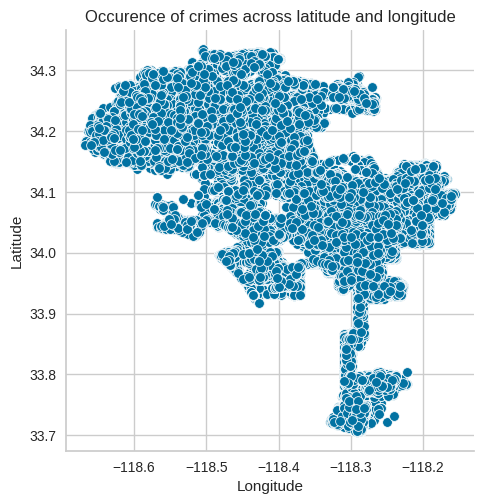

In [ ]:
lat_lon = data[['Latitude', 'Longitude']].copy()
lat_lon = lat_lon.loc[(lat_lon['Latitude'] != 0) & (lat_lon['Longitude'] != 0)]
#choose only those latitude and longitude values where the latitude and longitude values
#are not equal to zero. If zero values are not removed, then the x and y values are
#plotted only at 0.
lat_lon.reset_index(drop = True)
sns.relplot(x = 'Longitude', y = 'Latitude',data = lat_lon)
plt.title('Occurence of crimes across latitude and longitude')
#plot a relplot between latitude and longitude. This is similar to the shape of
#Los Angeles.
#Further, we use folium to plot these crime incidents on an actual map

In [ ]:
crime_locations = list(zip(data.Latitude, data.Longitude))
base = folium.Map(location = [34.052235, -118.243683], zoom_start = 10)
heatmap = plugins.HeatMap(crime_locations, radius = 5, blur = 2)
base.add_child(heatmap)

#Here, we use folium in order to plot the global mao
#We then overlap a heatmap over it using the latitude and longitudes from the
#dataframe

In [ ]:
#use kmeans and plot a cluster of crime points based on latitude and longitude
#perform scaling of points and then apply kmeans
scaler = StandardScaler()
X_loc = scaler.fit_transform(lat_lon)
new_df = pd.DataFrame(X_loc, index = lat_lon.index, columns = lat_lon.columns)
new_df.head()


,Latitude,Longitude
0,-0.554250,0.555372
1,-0.265499,0.966489
3,0.847734,-0.433015
4,1.313549,-0.859323
5,-0.271855,0.976933


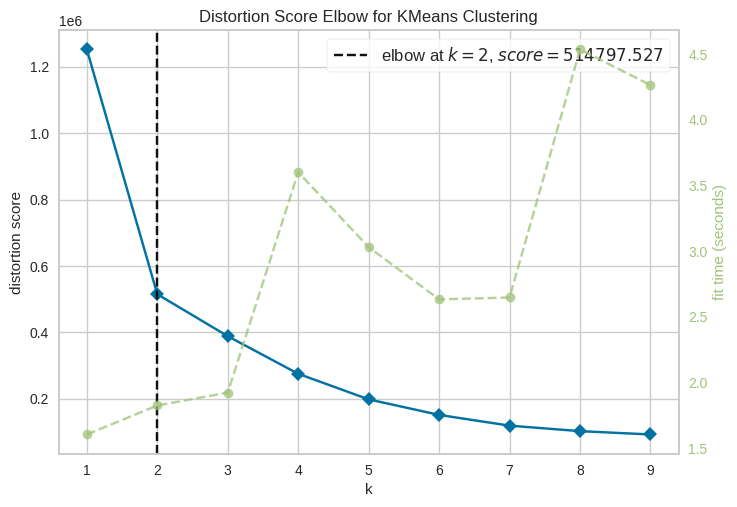

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [ ]:
kmeans = KMeans()
#visualise the elbow curve using KElbowVisualizer()
visualizer = KElbowVisualizer(kmeans, k=(1,10))
visualizer.fit(new_df)
visualizer.show()

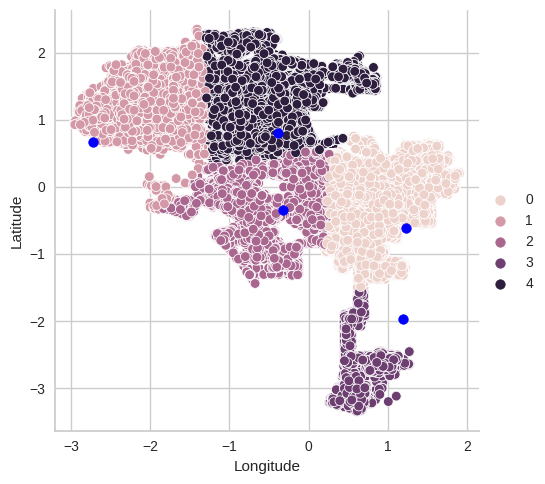

In [ ]:
kmeans = KMeans(n_clusters=5)
kmeans.fit(new_df)
sns.relplot(x='Longitude', y='Latitude', data=new_df, hue=kmeans.labels_)
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1],
            c='blue', s=50, alpha=1)

#Here, I plot a graph based on the clusters of (latitde, longitude) values
#I have also plotted the cluster center
#The crime locations are divided into five clusters
#each element within the cluster is similar to other elements within the same cluster
#but different from elements in other clusters.
#This similarity and difference is in terms of latitudes and longitudes
#Incidents that occured in nearby areas are in a single cluster whereas incidents that
#occurred in far-away areas are in other clusters


#break the grid into -3 to 20 or so and count the crimes in each grid. After that group by hour.

In [ ]:
kmeans.labels_

array([0, 0, 4, ..., 0, 0, 4], dtype=int32)

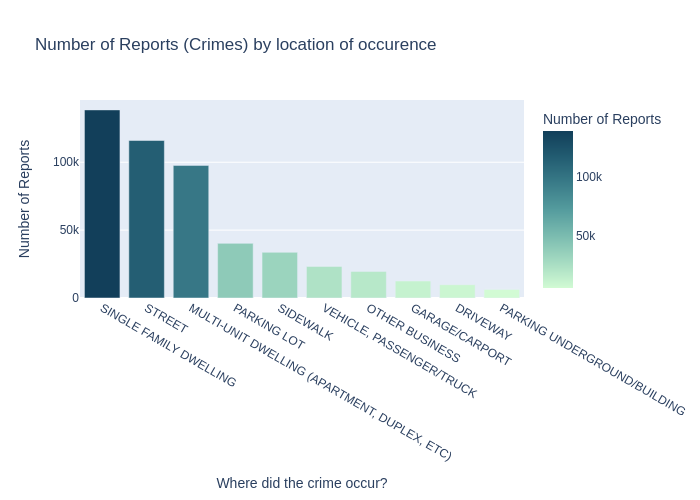

In [ ]:
#At what locations do crimes occur the most?

premises_group = data.groupby(['Premises_Description'])['Report_Number'].count().sort_values(ascending = False)[:10]
fig = go.Figure()
fig = px.bar(premises_group, x=premises_group.index, y='Report_Number', color='Report_Number',
             labels={'Report_Number': 'Number of Reports', 'Premises_Description' : 'Where did the crime occur?'},
             title='Number of Reports (Crimes) by location of occurence',
             color_continuous_scale='darkmint')
#fig.show()
image = pio.to_image(fig, format='png')
display.Image(image)

#Most of the crimes occur on the street with over 200k reports

**VICTIM BASED ANALYSIS**

In [ ]:
#Analysis of occurence of crimes based on the age of the victim
res_age = data.groupby(['Victim_Age'])['Report_Number'].count()
res_age
#In 206335 cases, the age of the victim is not known, so it replaced with the mean of age

Victim_Age
2     367
3     437
4     442
5     508
6     507
     ... 
95     80
96     84
97     62
98     65
99    308
Name: Report_Number, Length: 98, dtype: int64

In [ ]:
#!pip install -U kaleido

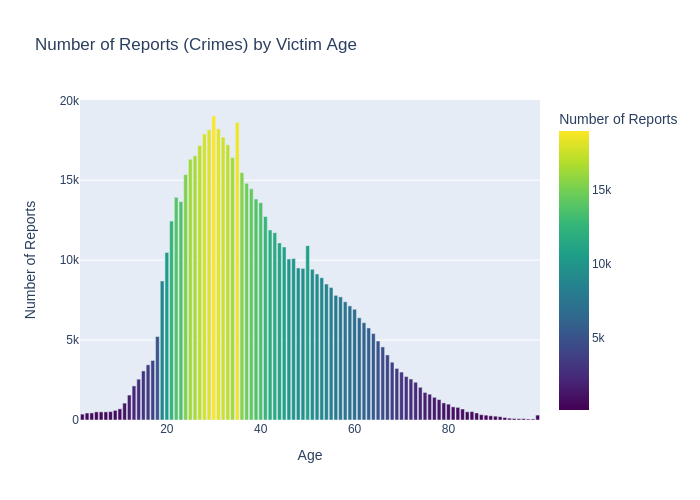

In [ ]:
fig = go.Figure()
fig = px.bar(res_age, x=res_age.index, y='Report_Number', color='Report_Number',
             labels={'Report_Number': 'Number of Reports', 'Victim_Age' : 'Age'},
             title='Number of Reports (Crimes) by Victim Age',
             color_continuous_scale='viridis')
#fig.show()
image1 = pio.to_image(fig, format='png')
display.Image(image1)
#In most of the cases, the age of the victim is unknown (represented by 0)
#it would make sense to analyse this data by bucketing the age column (from 1 rather than from 0)

In [ ]:
#!pip install -U kaleido
#!pip install -U plotly
data.isna().sum()

Report_Number            0
Date_Reported            0
Date_Occurred            0
Time_Occurred            0
Area_Name                0
Crime_Code               0
Crime_Description        0
Victim_Age               0
Victim_Sex              29
Victim_Ethnicity        28
Premises_Description     0
Weapon_Description       0
Case_Status              0
Status_Description       0
Location                 0
Latitude                 0
Longitude                0
Crm_Category             0
dtype: int64

In [ ]:
data['Age Range'] = pd.cut(data['Victim_Age'], bins = (1, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100), labels = ['1 to 10', '10 to 20', '20 to 30',
                                                                                                              '30 to 40', '40 to 50', '50 to 60', '60 to 70',
                                                                                                              '70 to 80', '80 to 90', '90 to 100'])
#0 is replaced by NaN which will not be used in further analysis
#divide the age column into ranges and bin the data

In [ ]:
data.isna().sum()

Report_Number            0
Date_Reported            0
Date_Occurred            0
Time_Occurred            0
Area_Name                0
Crime_Code               0
Crime_Description        0
Victim_Age               0
Victim_Sex              29
Victim_Ethnicity        28
Premises_Description     0
Weapon_Description       0
Case_Status              0
Status_Description       0
Location                 0
Latitude                 0
Longitude                0
Crm_Category             0
Age Range                0
dtype: int64

In [ ]:
data.head()

,Report_Number,Date_Reported,Date_Occurred,Time_Occurred,Area_Name,Crime_Code,Crime_Description,Victim_Age,Victim_Sex,Victim_Ethnicity,Premises_Description,Weapon_Description,Case_Status,Status_Description,Location,Latitude,Longitude,Crm_Category,Age Range
0,10304468,01/08/2020 12:00:00 AM,01/08/2020 12:00:00 AM,2230,Southwest,624,BATTERY - SIMPLE ASSAULT,36,F,B,SINGLE FAMILY DWELLING,"STRONG-ARM (HANDS, FIST, FEET OR BODILY FORCE)",AO,Adult Other,1100 W 39TH PL,34.0141,-118.2978,Violent and Sexual Crimes,30 to 40
1,190101086,01/02/2020 12:00:00 AM,01/01/2020 12:00:00 AM,330,Central,624,BATTERY - SIMPLE ASSAULT,25,M,H,SIDEWALK,UNKNOWN WEAPON/OTHER WEAPON,IC,Invest Cont,700 S HILL ST,34.0459,-118.2545,Violent and Sexual Crimes,20 to 30
3,191501505,01/01/2020 12:00:00 AM,01/01/2020 12:00:00 AM,1730,N Hollywood,745,VANDALISM - MISDEAMEANOR ($399 OR UNDER),76,F,W,"MULTI-UNIT DWELLING (APARTMENT, DUPLEX, ETC)",N/A,IC,Invest Cont,5400 CORTEEN PL,34.1685,-118.4019,Destruction of Property,70 to 80
4,191921269,01/01/2020 12:00:00 AM,01/01/2020 12:00:00 AM,415,Mission,740,"VANDALISM - FELONY ($400 & OVER, ALL CHURCH VA...",31,X,X,BEAUTY SUPPLY STORE,N/A,IC,Invest Cont,14400 TITUS ST,34.2198,-118.4468,Destruction of Property,30 to 40
5,200100501,01/02/2020 12:00:00 AM,01/01/2020 12:00:00 AM,30,Central,121,"RAPE, FORCIBLE",25,F,H,NIGHT CLUB (OPEN EVENINGS ONLY),UNKNOWN WEAPON/OTHER WEAPON,IC,Invest Cont,700 S BROADWAY,34.0452,-118.2534,Violent and Sexual Crimes,20 to 30


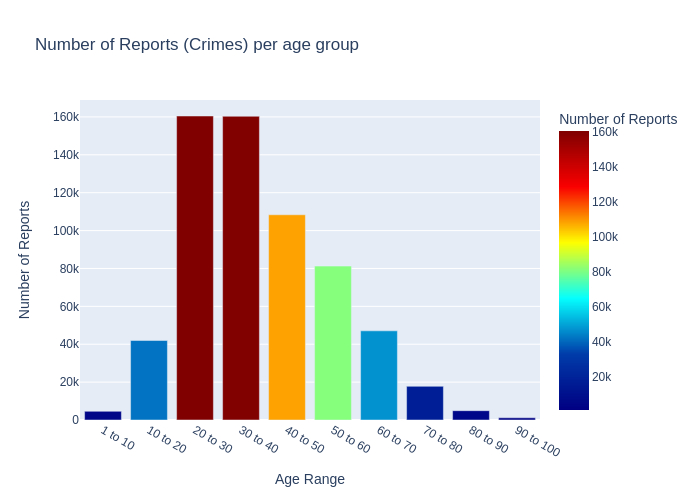

In [ ]:
res_age_range = data.groupby(['Age Range'])['Report_Number'].count()

fig = go.Figure()
fig = px.bar(res_age_range, x=res_age_range.index, y='Report_Number', color='Report_Number',
             labels={'Report_Number': 'Number of Reports', 'Age Range' : 'Age Range'},
             title='Number of Reports (Crimes) per age group',
             color_continuous_scale='Jet')
#fig.show()
#plot the number of cases on the basis of age range

image2 = pio.to_image(fig, format='png')
display.Image(image2)
#looking at the below analysis, we see that most of the victims are in the age range
#of 20-30 and 30-40.

In [ ]:
data['Victim_Sex'].unique()
#unique "Victim_Sex" values

array(['F', 'M', 'X', 'H', nan], dtype=object)

In [ ]:
victim_sex_dictionary = {'M': 'Male', 'F':'Female', 'X':'Unknown', 'H':'Unknown', '-':'Unknown'}
data['Victim_Sex'] = data['Victim_Sex'].map(victim_sex_dictionary)
data['Victim_Sex'] = data['Victim_Sex'].replace({np.nan: 'Unknown'})
#Map H, X and - to "Unknown"
#Also replace nan values with "Unknown"

In [ ]:
data['Victim_Sex'].unique()

array(['Female', 'Male', 'Unknown'], dtype=object)

In [ ]:
data.isna().sum()
#see if the null values have been handled

Report_Number            0
Date_Reported            0
Date_Occurred            0
Time_Occurred            0
Area_Name                0
Crime_Code               0
Crime_Description        0
Victim_Age               0
Victim_Sex               0
Victim_Ethnicity        28
Premises_Description     0
Weapon_Description       0
Case_Status              0
Status_Description       0
Location                 0
Latitude                 0
Longitude                0
Crm_Category             0
Age Range                0
dtype: int64

In [ ]:
data[data['Victim_Sex'].isin(['Male', 'Female', 'Unknown'])].groupby(['Victim_Sex'])['Report_Number'].count()
#Here, I have considered only M, F and X since according to the dataset description provided by
#LA County, there are three identifiable genders, M, F and X. H and N/A (not available) are not considered.

Victim_Sex
Female     303700
Male       316521
Unknown      7691
Name: Report_Number, dtype: int64

Text(0.5, 1.0, 'Occurence of crimes based on the sex of the victim')

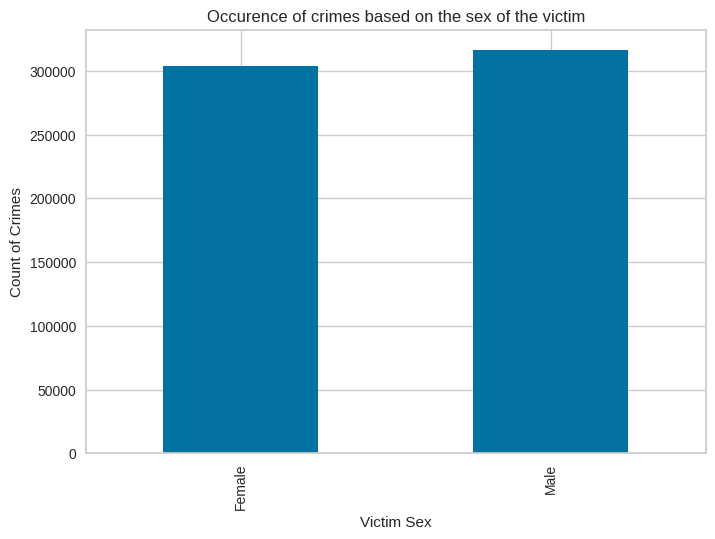

In [ ]:
data[data['Victim_Sex'].isin(['Male', 'Female'])].groupby(['Victim_Sex'])['Report_Number'].count().plot(kind = 'bar')
plt.xlabel('Victim Sex')
plt.ylabel('Count of Crimes')
plt.title('Occurence of crimes based on the sex of the victim')
#we see that most of the victims are males.
#there are also some victims whose gender is not reported.

In [ ]:
victim_descent_dictionary = {'A':'Other Asian', 'B':'Black', 'C': 'Chinese', 'D':'Cambodian','F':'Filipino', 'G':'Guamanian',
                             'H':'LatinX', 'I':'Native American/Alaskan', 'J':'Japanese', 'K':'Korean', 'L':'Laotian', 'O':'Other',
                             'P':'Pacific Islander', 'S':'Samoan', 'U':'Hawaiian','V':'Vietnamese', 'W':'White', 'X':'Unknown', 'Z':'Asian Indian'}
data['Victim_Ethnicity'] = data['Victim_Ethnicity'].map(victim_descent_dictionary)
data['Victim_Ethnicity'] = data['Victim_Ethnicity'].replace({np.nan: 'Unknown'})

In [ ]:
data['Victim_Ethnicity'].unique()

array(['Black', 'LatinX', 'White', 'Unknown', 'Other Asian', 'Other',
       'Chinese', 'Filipino', 'Korean', 'Native American/Alaskan',
       'Vietnamese', 'Asian Indian', 'Japanese', 'Pacific Islander',
       'Guamanian', 'Hawaiian', 'Cambodian', 'Samoan', 'Laotian'],
      dtype=object)

In [ ]:
data.isna().sum()

Report_Number           0
Date_Reported           0
Date_Occurred           0
Time_Occurred           0
Area_Name               0
Crime_Code              0
Crime_Description       0
Victim_Age              0
Victim_Sex              0
Victim_Ethnicity        0
Premises_Description    0
Weapon_Description      0
Case_Status             0
Status_Description      0
Location                0
Latitude                0
Longitude               0
Crm_Category            0
Age Range               0
dtype: int64

In [ ]:
data.head()

,Report_Number,Date_Reported,Date_Occurred,Time_Occurred,Area_Name,Crime_Code,Crime_Description,Victim_Age,Victim_Sex,Victim_Ethnicity,Premises_Description,Weapon_Description,Case_Status,Status_Description,Location,Latitude,Longitude,Crm_Category,Age Range
0,10304468,01/08/2020 12:00:00 AM,01/08/2020 12:00:00 AM,2230,Southwest,624,BATTERY - SIMPLE ASSAULT,36,Female,Black,SINGLE FAMILY DWELLING,"STRONG-ARM (HANDS, FIST, FEET OR BODILY FORCE)",AO,Adult Other,1100 W 39TH PL,34.0141,-118.2978,Violent and Sexual Crimes,30 to 40
1,190101086,01/02/2020 12:00:00 AM,01/01/2020 12:00:00 AM,330,Central,624,BATTERY - SIMPLE ASSAULT,25,Male,LatinX,SIDEWALK,UNKNOWN WEAPON/OTHER WEAPON,IC,Invest Cont,700 S HILL ST,34.0459,-118.2545,Violent and Sexual Crimes,20 to 30
3,191501505,01/01/2020 12:00:00 AM,01/01/2020 12:00:00 AM,1730,N Hollywood,745,VANDALISM - MISDEAMEANOR ($399 OR UNDER),76,Female,White,"MULTI-UNIT DWELLING (APARTMENT, DUPLEX, ETC)",N/A,IC,Invest Cont,5400 CORTEEN PL,34.1685,-118.4019,Destruction of Property,70 to 80
4,191921269,01/01/2020 12:00:00 AM,01/01/2020 12:00:00 AM,415,Mission,740,"VANDALISM - FELONY ($400 & OVER, ALL CHURCH VA...",31,Unknown,Unknown,BEAUTY SUPPLY STORE,N/A,IC,Invest Cont,14400 TITUS ST,34.2198,-118.4468,Destruction of Property,30 to 40
5,200100501,01/02/2020 12:00:00 AM,01/01/2020 12:00:00 AM,30,Central,121,"RAPE, FORCIBLE",25,Female,LatinX,NIGHT CLUB (OPEN EVENINGS ONLY),UNKNOWN WEAPON/OTHER WEAPON,IC,Invest Cont,700 S BROADWAY,34.0452,-118.2534,Violent and Sexual Crimes,20 to 30


In [ ]:
data.isna().sum()

Report_Number           0
Date_Reported           0
Date_Occurred           0
Time_Occurred           0
Area_Name               0
Crime_Code              0
Crime_Description       0
Victim_Age              0
Victim_Sex              0
Victim_Ethnicity        0
Premises_Description    0
Weapon_Description      0
Case_Status             0
Status_Description      0
Location                0
Latitude                0
Longitude               0
Crm_Category            0
Age Range               0
dtype: int64

Text(0.5, 1.0, 'Occurence of crimes based on the ethnicity of the victim')

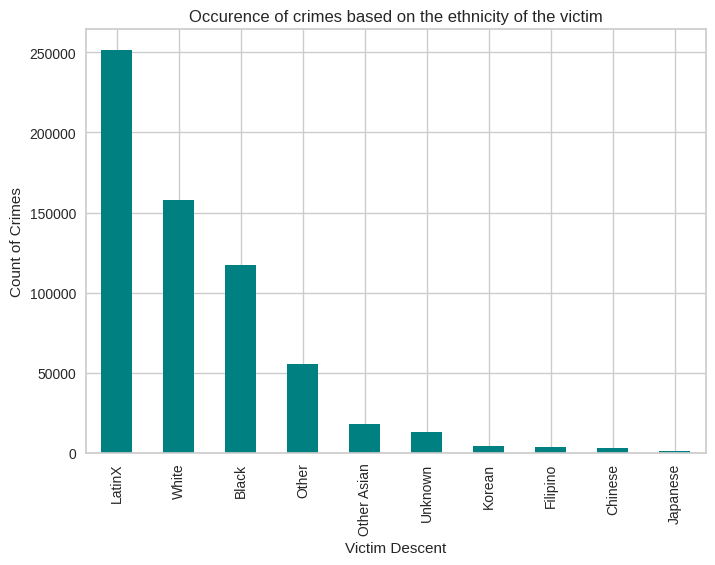

In [ ]:
data.groupby(['Victim_Ethnicity'])['Report_Number'].count().sort_values(ascending = False)[:10].plot(kind = 'bar', color = 'teal')
plt.xlabel('Victim Descent')
plt.ylabel('Count of Crimes')
plt.title('Occurence of crimes based on the ethnicity of the victim')

#We see that most of the victims of crimes are people of Hispanic/Latin/Mexican descent followed by
#people of white descent

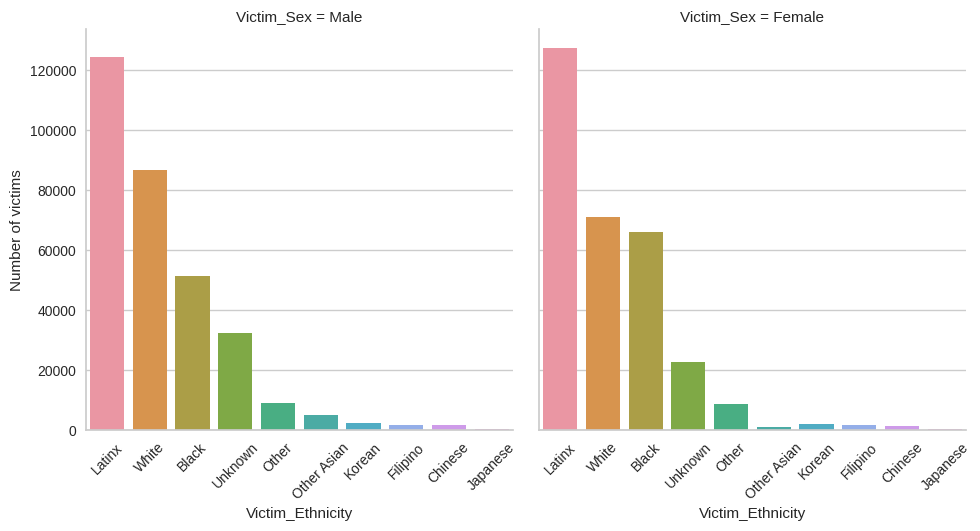

In [ ]:
plot = sns.catplot(data = data, kind = 'count',  x = "Victim_Ethnicity", col = "Victim_Sex", col_order = data['Victim_Sex'].value_counts()[:2].index,
                   order = data['Victim_Ethnicity'].value_counts()[:10].index)
plot.set_xticklabels(['Latinx','White','Black','Unknown', 'Other', 'Other Asian','Korean', 'Filipino', 'Chinese', 'Japanese'], rotation= 45)
plot.set_ylabels("Number of victims")
#plot the number of crimes based on ethnicity and divided by the sex of the victim.

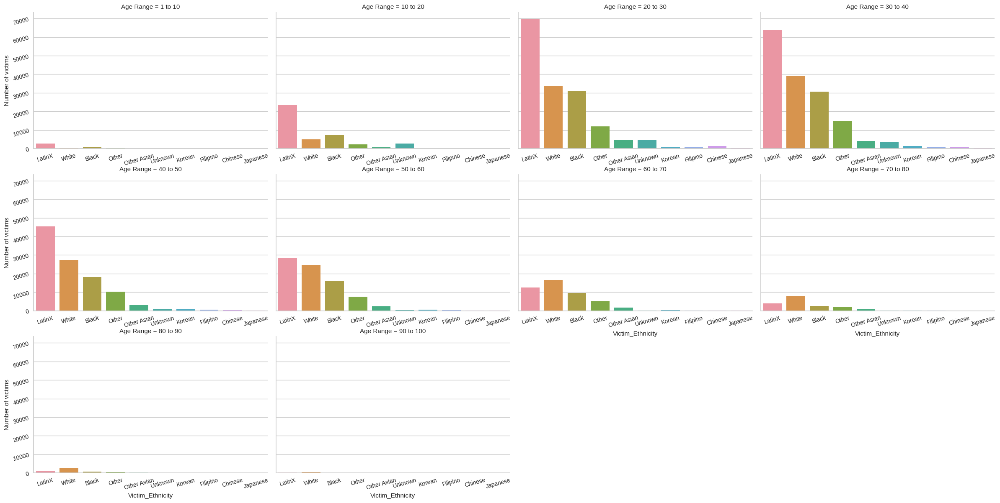

In [ ]:
plot = sns.catplot(data = data, kind = 'count',  x = "Victim_Ethnicity", col = "Age Range",
                   order = data['Victim_Ethnicity'].value_counts()[:10].index, col_wrap = 4, height = 4, aspect = 1.5)
plot.fig.tight_layout()

# labels = ['Latinx','White','Black','Unknown', 'Other', 'Other Asian','Korean', 'Filipino', 'Chinese', 'Japanese']
# for ax in plot.axes:
#   ax.set_xticklabels(labels, rotation=45, ha="right")

for ax in plot.axes.flatten():
    ax.tick_params(labelbottom=True, rotation = 15)

#plot.set_xticklabels(['Latinx','White','Black','Unknown', 'Other', 'Other Asian','Korean', 'Filipino', 'Chinese', 'Japanese'], rotation= 45)
plot.set_ylabels("Number of victims")
#plot graphs representing the number of crimes based on victim ethnicity for each age group

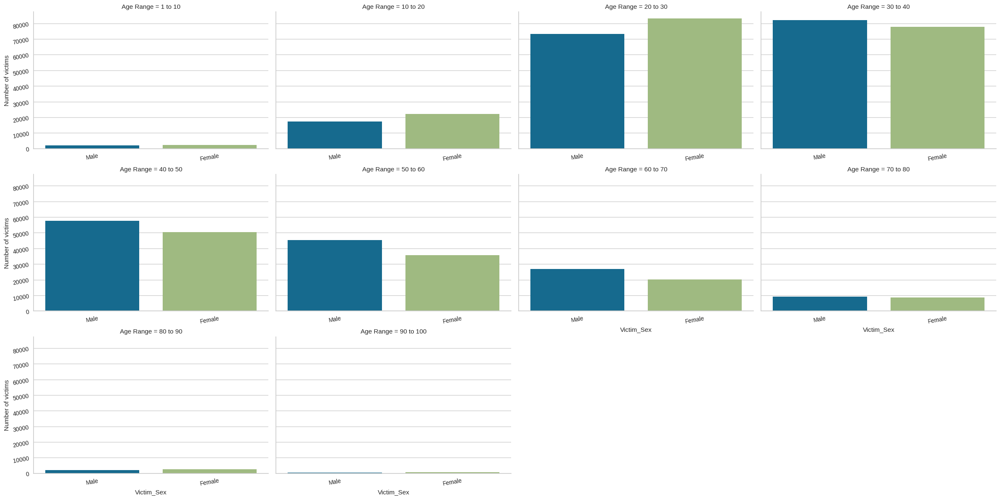

In [ ]:
plot = sns.catplot(data = data, kind = 'count',  x = "Victim_Sex", col = "Age Range",
                   order = data['Victim_Sex'].value_counts()[:2].index, col_wrap = 4, height = 4, aspect = 1.5)
plot.fig.tight_layout()

for ax in plot.axes.flatten():
    ax.tick_params(labelbottom=True, rotation = 10)

plot.set_ylabels("Number of victims")

#plot graphs representing the number of crimes based on victim sex for each age group

**CRIME BASED ANALYSIS**

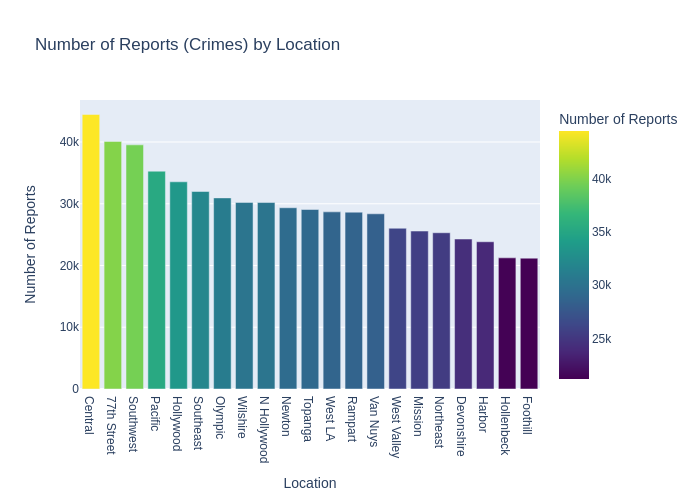

In [ ]:
fig = go.Figure()
res = data.groupby(['Area_Name'])['Report_Number'].count().sort_values(ascending = False)
fig = px.bar(res, x=res.index, y='Report_Number', color='Report_Number',
             labels={'Report_Number': 'Number of Reports', 'Area_Name' : 'Location'},
             title='Number of Reports (Crimes) by Location',
             color_continuous_scale='viridis')
#fig.show()
image3 = pio.to_image(fig, format='png')
display.Image(image3)
#the below graph represents the occurence of crimes based on their location
#As per the graph, most of the crimes are reported in the "Central" area followed by
#"77th Street", "Pacific" and "Southwest"

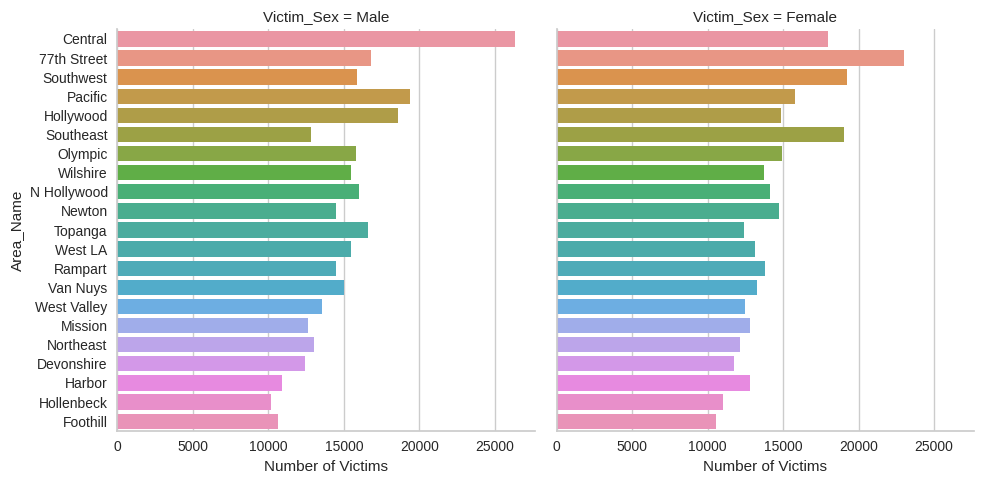

In [ ]:
plot = sns.catplot(data = data, kind = 'count',  col = "Victim_Sex", y = "Area_Name", col_order = data['Victim_Sex'].value_counts()[:2].index,
                   order = data['Area_Name'].value_counts().index)
plot.set_xlabels("Number of Victims")
#plot the number of victims of "male" and "female" sex in each area

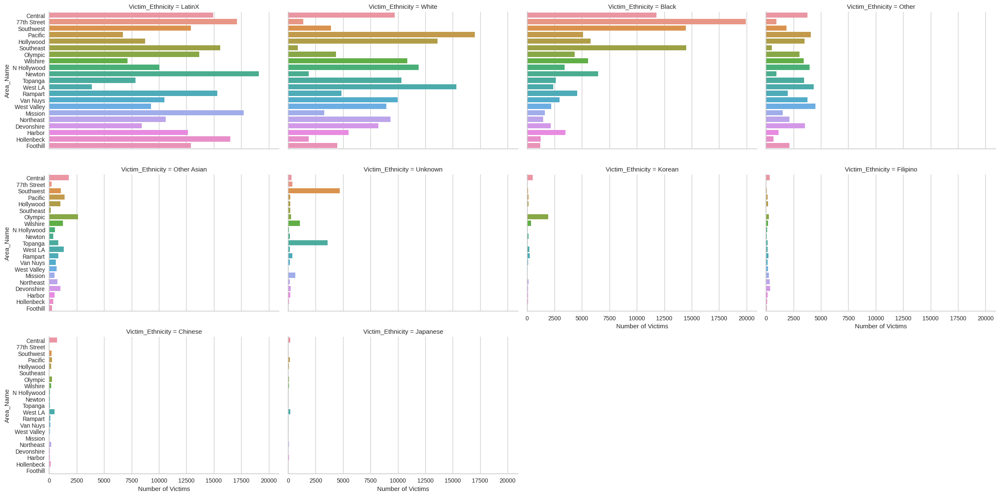

In [ ]:
plot = sns.catplot(data = data, kind = 'count',  col = "Victim_Ethnicity", y = "Area_Name", col_order = data['Victim_Ethnicity'].value_counts()[:10].index,
                   order = data['Area_Name'].value_counts().index, col_wrap = 4, height = 4, aspect = 1.5)
plot.set_xlabels("Number of Victims")
#plot the number of victims based on ethnicity in each area

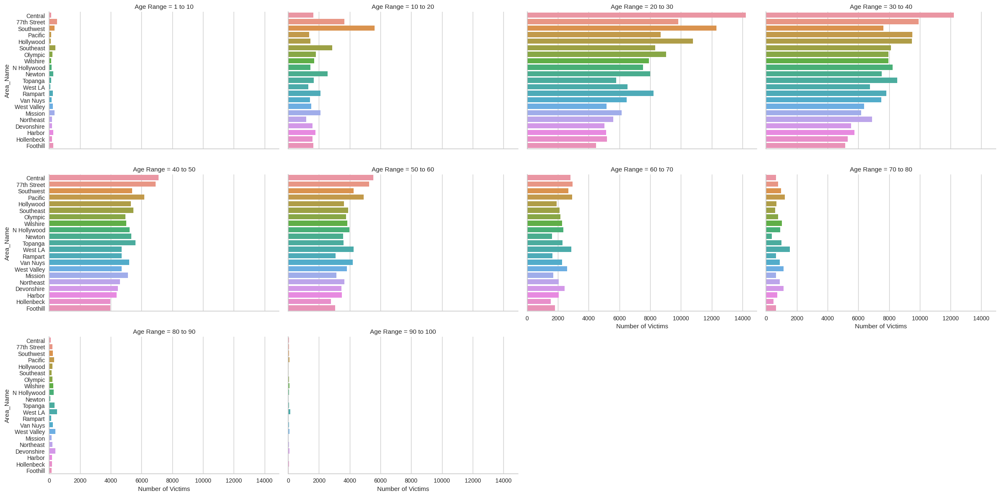

In [ ]:
plot = sns.catplot(data = data, kind = 'count',  col = "Age Range", y = "Area_Name",
                   order = data['Area_Name'].value_counts().index, col_wrap = 4, height = 4, aspect = 1.5)
plot.set_xlabels("Number of Victims")
#plot the number of victims based on age range in each area

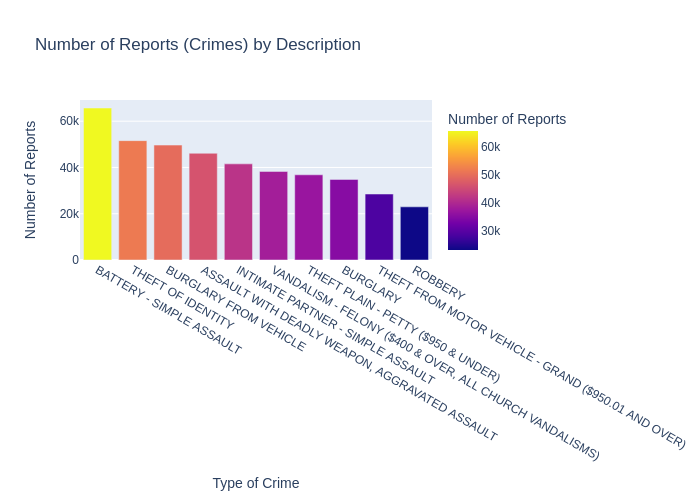

In [ ]:
fig = go.Figure()
res = data.groupby(['Crime_Description'])['Report_Number'].count().sort_values(ascending = False).nlargest(n = 10)
fig = px.bar(res, x=res.index, y='Report_Number', color='Report_Number',
             labels={'Report_Number': 'Number of Reports', 'Crime_Description' : 'Type of Crime'},
             title='Number of Reports (Crimes) by Description',
             color_continuous_scale='Plasma')
#fig.show()

#plot the number of crimes of each type (before grouping crime categories)
image4 = pio.to_image(fig, format='png')
display.Image(image4)
#We see that the top most committed crime in Los Angeles is the stealing of vehicles followed by
#battery - simple assualt

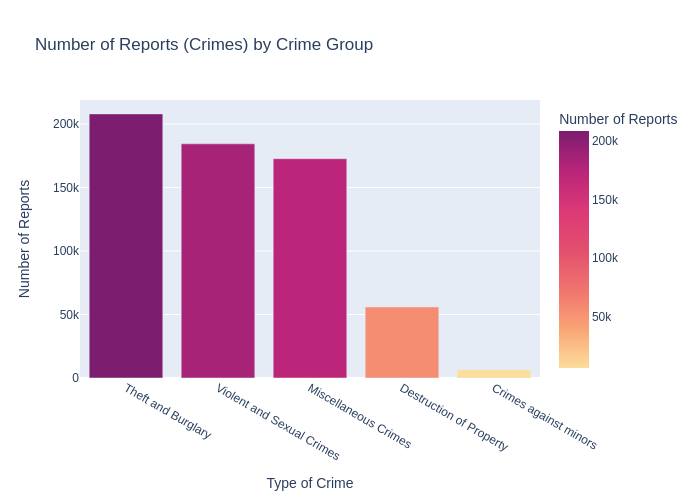

In [ ]:
#On grouping similar crimes, we get the following distribution

fig = go.Figure()
res = data.groupby(['Crm_Category'])['Report_Number'].count().sort_values(ascending = False).nlargest(n = 10)
fig = px.bar(res, x=res.index, y='Report_Number', color='Report_Number',
             labels={'Report_Number': 'Number of Reports', 'Crm_Category' : 'Type of Crime'},
             title='Number of Reports (Crimes) by Crime Group',
             color_continuous_scale='sunsetdark')
#fig.show()
#plot the number of crimes of each type (after grouping crime categories)

image5 = pio.to_image(fig, format='png')
display.Image(image5)

Text(0.5, 1.0, 'Number of crimes based on the weapon description')

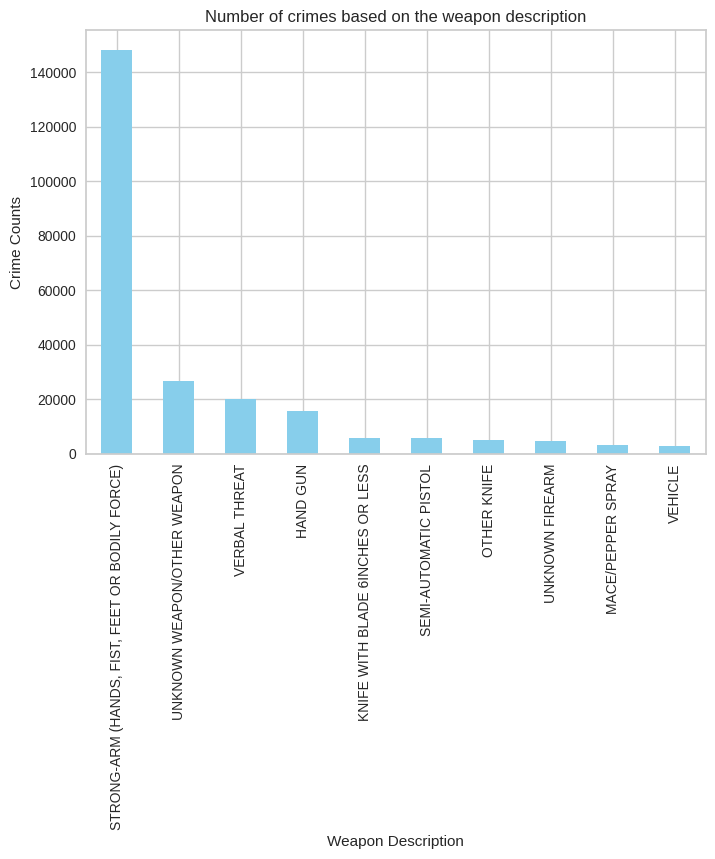

In [ ]:
data['Weapon_Description'][data['Weapon_Description'] != 'N/A'].value_counts().head(10).plot(kind = 'bar', color = 'skyblue')
#Here, we are excluding the values where we replaces the NaN values with N/A
#After that, we see that majority of the crimes are committed using 'Strong-Arm (Hands, Fist,
#Feet or Bodily Force)

#plot the most commonly used weapons
plt.xlabel('Weapon Description')
plt.ylabel('Crime Counts')
plt.title('Number of crimes based on the weapon description')

In [ ]:
#Based on the description of the crime dataset, we see that, those rows where Crm Cd 1 is 100-300, are severe crimes
#whereas Crm Cd 1 values > 300 are less severe crimes
#Therefore, we introduce a new column known as severity

data['Severity'] = np.where(data['Crime_Code'] < 300, 'Severe', 'Not Severe')
data.head(20)

,Report_Number,Date_Reported,Date_Occurred,Time_Occurred,Area_Name,Crime_Code,Crime_Description,Victim_Age,Victim_Sex,Victim_Ethnicity,Premises_Description,Weapon_Description,Case_Status,Status_Description,Location,Latitude,Longitude,Crm_Category,Age Range,Severity
0,10304468,01/08/2020 12:00:00 AM,01/08/2020 12:00:00 AM,2230,Southwest,624,BATTERY - SIMPLE ASSAULT,36,Female,Black,SINGLE FAMILY DWELLING,"STRONG-ARM (HANDS, FIST, FEET OR BODILY FORCE)",AO,Adult Other,1100 W 39TH PL,34.0141,-118.2978,Violent and Sexual Crimes,30 to 40,Not Severe
1,190101086,01/02/2020 12:00:00 AM,01/01/2020 12:00:00 AM,330,Central,624,BATTERY - SIMPLE ASSAULT,25,Male,LatinX,SIDEWALK,UNKNOWN WEAPON/OTHER WEAPON,IC,Invest Cont,700 S HILL ST,34.0459,-118.2545,Violent and Sexual Crimes,20 to 30,Not Severe
3,191501505,01/01/2020 12:00:00 AM,01/01/2020 12:00:00 AM,1730,N Hollywood,745,VANDALISM - MISDEAMEANOR ($399 OR UNDER),76,Female,White,"MULTI-UNIT DWELLING (APARTMENT, DUPLEX, ETC)",N/A,IC,Invest Cont,5400 CORTEEN PL,34.1685,-118.4019,Destruction of Property,70 to 80,Not Severe
4,191921269,01/01/2020 12:00:00 AM,01/01/2020 12:00:00 AM,415,Mission,740,"VANDALISM - FELONY ($400 & OVER, ALL CHURCH VA...",31,Unknown,Unknown,BEAUTY SUPPLY STORE,N/A,IC,Invest Cont,14400 TITUS ST,34.2198,-118.4468,Destruction of Property,30 to 40,Not Severe
5,200100501,01/02/2020 12:00:00 AM,01/01/2020 12:00:00 AM,30,Central,121,"RAPE, FORCIBLE",25,Female,LatinX,NIGHT CLUB (OPEN EVENINGS ONLY),UNKNOWN WEAPON/OTHER WEAPON,IC,Invest Cont,700 S BROADWAY,34.0452,-118.2534,Violent and Sexual Crimes,20 to 30,Severe
6,200100502,01/02/2020 12:00:00 AM,01/02/2020 12:00:00 AM,1315,Central,442,SHOPLIFTING - PETTY THEFT ($950 & UNDER),23,Male,LatinX,DEPARTMENT STORE,N/A,IC,Invest Cont,700 S FIGUEROA ST,34.0483,-118.2631,Theft and Burglary,20 to 30,Not Severe
8,200100507,01/04/2020 12:00:00 AM,01/04/2020 12:00:00 AM,200,Central,341,"THEFT-GRAND ($950.01 & OVER)EXCPT,GUNS,FOWL,LI...",23,Male,Black,"MULTI-UNIT DWELLING (APARTMENT, DUPLEX, ETC)",N/A,IC,Invest Cont,700 BERNARD ST,34.0677,-118.2398,Theft and Burglary,20 to 30,Not Severe
10,200100509,01/04/2020 12:00:00 AM,01/04/2020 12:00:00 AM,2200,Central,330,BURGLARY FROM VEHICLE,29,Male,Other Asian,STREET,ROCK/THROWN OBJECT,IC,Invest Cont,15TH,34.0359,-118.2648,Theft and Burglary,20 to 30,Not Severe
11,200100510,01/05/2020 12:00:00 AM,01/05/2020 12:00:00 AM,955,Central,930,CRIMINAL THREATS - NO WEAPON DISPLAYED,35,Male,Other,PARKING LOT,VERBAL THREAT,IC,Invest Cont,800 N ALAMEDA ST,34.0615,-118.2412,Miscellaneous Crimes,30 to 40,Not Severe
12,200100514,01/05/2020 12:00:00 AM,01/05/2020 12:00:00 AM,1355,Central,341,"THEFT-GRAND ($950.01 & OVER)EXCPT,GUNS,FOWL,LI...",41,Male,Other Asian,HOTEL,N/A,AA,Adult Arrest,800 S OLIVE ST,34.0452,-118.2569,Theft and Burglary,40 to 50,Not Severe


<Axes: >

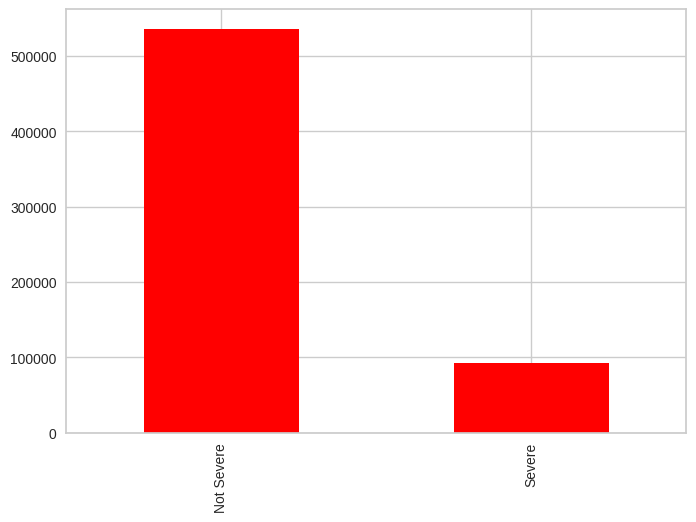

In [ ]:
data['Severity'].value_counts().plot(kind = 'bar', color = 'red')
#we see that "Severe" crimes are considerably lesser than "Not Severe" crimes.

In [ ]:
#Time series based analysis
#reporting and occurence date (days between)

In [ ]:
data['Date_Reported'] = pd.to_datetime(data['Date_Reported'])
data['Date_Occurred'] = pd.to_datetime(data['Date_Occurred'])

In [ ]:
data['Year_Occurence'] = data['Date_Occurred'].dt.year
data['Month_Occurence'] = data['Date_Occurred'].dt.month_name()
data['Day_Occurence'] = data['Date_Occurred'].dt.day_name()

In [ ]:
data.head()

,Report_Number,Date_Reported,Date_Occurred,Time_Occurred,Area_Name,Crime_Code,Crime_Description,Victim_Age,Victim_Sex,Victim_Ethnicity,...,Status_Description,Location,Latitude,Longitude,Crm_Category,Age Range,Severity,Year_Occurence,Month_Occurence,Day_Occurence
0,10304468,2020-01-08,2020-01-08,2230,Southwest,624,BATTERY - SIMPLE ASSAULT,36,Female,Black,...,Adult Other,1100 W 39TH PL,34.0141,-118.2978,Violent and Sexual Crimes,30 to 40,Not Severe,2020,January,Wednesday
1,190101086,2020-01-02,2020-01-01,330,Central,624,BATTERY - SIMPLE ASSAULT,25,Male,LatinX,...,Invest Cont,700 S HILL ST,34.0459,-118.2545,Violent and Sexual Crimes,20 to 30,Not Severe,2020,January,Wednesday
3,191501505,2020-01-01,2020-01-01,1730,N Hollywood,745,VANDALISM - MISDEAMEANOR ($399 OR UNDER),76,Female,White,...,Invest Cont,5400 CORTEEN PL,34.1685,-118.4019,Destruction of Property,70 to 80,Not Severe,2020,January,Wednesday
4,191921269,2020-01-01,2020-01-01,415,Mission,740,"VANDALISM - FELONY ($400 & OVER, ALL CHURCH VA...",31,Unknown,Unknown,...,Invest Cont,14400 TITUS ST,34.2198,-118.4468,Destruction of Property,30 to 40,Not Severe,2020,January,Wednesday
5,200100501,2020-01-02,2020-01-01,30,Central,121,"RAPE, FORCIBLE",25,Female,LatinX,...,Invest Cont,700 S BROADWAY,34.0452,-118.2534,Violent and Sexual Crimes,20 to 30,Severe,2020,January,Wednesday


In [ ]:
data['Days Between'] = (data['Date_Reported'] - data['Date_Occurred']).dt.days
print("The nuumber of cases reported within the first 10 days: ")
data.groupby(['Days Between'])['Report_Number'].count().reset_index().head(10)
#Most of the crimes are reported on the same day it occurred

The nuumber of cases reported within the first 10 days: 


,Days Between,Report_Number
0,0,325864
1,1,117522
2,2,36990
3,3,21719
4,4,14397
5,5,10614
6,6,8039
7,7,7230
8,8,5458
9,9,4382


In [ ]:
print("The number of cases that go unreported for a long period of time: ")
data.groupby(['Days Between'])['Report_Number'].count().reset_index().tail(10)
#some crimes go unreported for long periods of times

The number of cases that go unreported for a long period of time: 


,Days Between,Report_Number
1186,1337,1
1187,1339,1
1188,1345,1
1189,1357,1
1190,1365,1
1191,1368,1
1192,1369,2
1193,1370,2
1194,1379,1
1195,1400,1


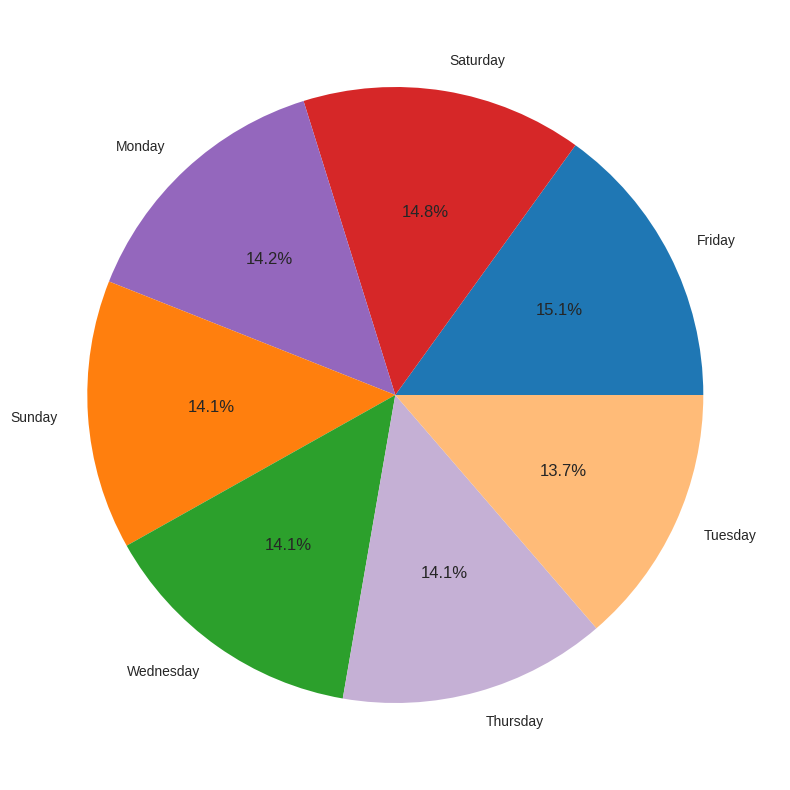

In [ ]:
#Which days are the most "violent" in LA
days = data['Day_Occurence'].value_counts()
plt.figure(figsize=(10, 10))
pie_colours = ['#1f77b4', '#d62728', '#9467bd', '#ff7f0e', '#2ca02c', '#c5b0d5', '#ffbb78']
plt.pie(days, labels = days.index, autopct='%1.1f%%', colors = pie_colours)
plt.show()

#Friday appears to be the most violent followed by Saturday. It may be attributed
#to the end of the week outings.

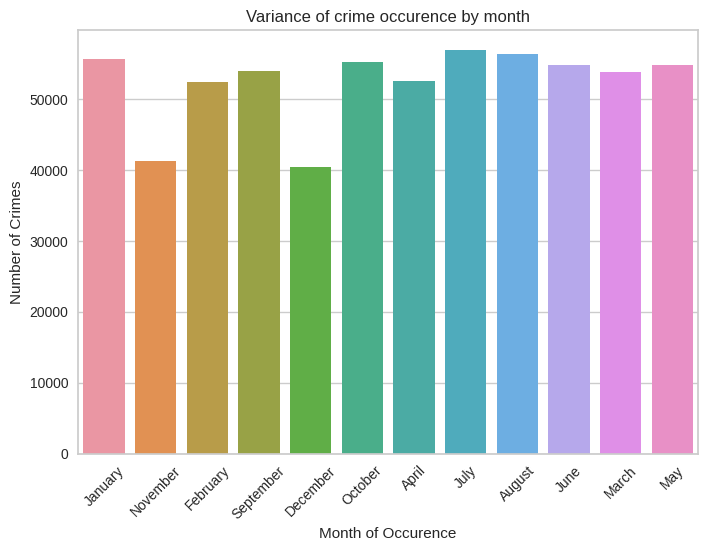

In [ ]:
sns.countplot(data = data, x = 'Month_Occurence')
plt.xticks(rotation = 45)
plt.xlabel('Month of Occurence')
plt.ylabel('Number of Crimes')
plt.title('Variance of crime occurence by month')
plt.show()
#July appears to be the month with the highest crimes

2020    151143
2021    158911
2022    178351
2023    139507
Name: Year_Occurence, dtype: int64


([<matplotlib.axis.XTick at 0x7e2787643160>,
 [Text(2020, 0, '2020'),
  Text(2021, 0, '2021'),
  Text(2022, 0, '2022'),
  Text(2023, 0, '2023')])

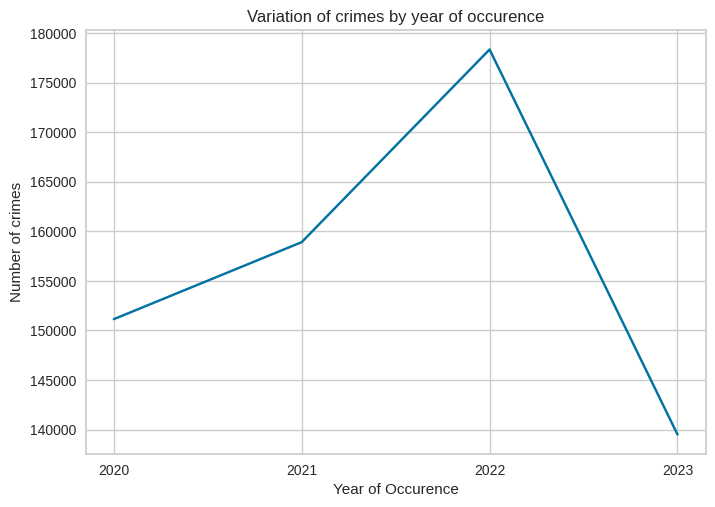

In [ ]:
yearly_occurence = data['Year_Occurence'].value_counts().sort_index()
print(yearly_occurence)
sns.lineplot(x = yearly_occurence.index, y = yearly_occurence.values)
plt.ylabel('Number of crimes')
plt.xlabel('Year of Occurence')
plt.title('Variation of crimes by year of occurence')
plt.xticks(yearly_occurence.index.astype(int))
#looking at our graph, we can see that crimes peaked in 2022 (with respect to the dataset)

Text(0.5, 1.0, 'Distribution of Crimes over the years')

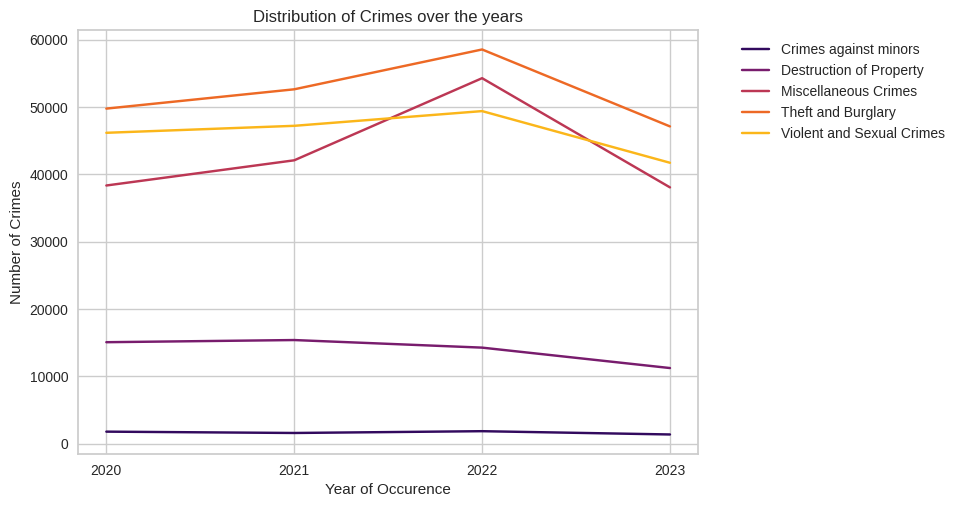

In [ ]:
res = data.groupby(['Crm_Category', 'Year_Occurence'])['Report_Number'].count().reset_index()
plt.xticks(yearly_occurence.index.astype(int))
sns.lineplot(x = 'Year_Occurence', y = 'Report_Number', hue = 'Crm_Category', data = res, palette = 'inferno')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.ylabel('Number of Crimes')
plt.xlabel('Year of Occurence')
plt.title('Distribution of Crimes over the years')
#The variation in the number of dirrent types of crimes committed over the years

In [ ]:
#Things to perform next:

#Since our stakeholders are realtors and people looking to move to LA, we first need to identify a set of crimes pertaining to them
#that is, house related crimes, street crimes, etc.
#Also, our data is imbalanced because of high number of crimes of one type, so we need to use a shuffling technique while initializing training/testing/validation data.
#Next, we need to identify important or highly correlated features since our target variable is "Crm_Category". (Using a heatmap to understand)
#Encode this variable since it is categorical
#Scale&Encode other features
#Build at least 2 classification algorithms (SGDClassifier? RF?)
#So, suppose we connect with Zillow or Apartments.com, given a location/latitude/longitude (out of the ones present)
#and certain other characteristics (of the resident), what is the most likely crime?
#Based on this, a person can choose whether or not to stay there or look for measures to prevent something like that from occuring.

In [ ]:
data.columns

Index(['Report_Number', 'Date_Reported', 'Date_Occurred', 'Time_Occurred',
       'Area_Name', 'Crime_Code', 'Crime_Description', 'Victim_Age',
       'Victim_Sex', 'Victim_Ethnicity', 'Premises_Description',
       'Weapon_Description', 'Case_Status', 'Status_Description', 'Location',
       'Latitude', 'Longitude', 'Crm_Category', 'Age Range', 'Severity',
       'Year_Occurence', 'Month_Occurence', 'Day_Occurence', 'Days Between'],
      dtype='object')

In [ ]:
cols_to_remove = ['Date_Occurred', 'Report_Number', 'Date_Reported', 'Crime_Code', 'Crime_Description', 'Weapon_Description', 'Case_Status', 'Status_Description', 'Days Between', 'Location', 'Age Range']
dataframe = data.drop(cols_to_remove, axis = 1)

In [ ]:
dataframe['Victim_Sex'].value_counts()

Male       316521
Female     303700
Unknown      7691
Name: Victim_Sex, dtype: int64

In [ ]:
dataframe.columns

Index(['Time_Occurred', 'Area_Name', 'Victim_Age', 'Victim_Sex',
       'Victim_Ethnicity', 'Premises_Description', 'Latitude', 'Longitude',
       'Crm_Category', 'Severity', 'Year_Occurence', 'Month_Occurence',
       'Day_Occurence'],
      dtype='object')

In [ ]:
dataframe.shape

(627912, 13)

In [ ]:
#creating a column to represent hour of occurence
dataframe['Hour'] = dataframe['Time_Occurred']//100

In [ ]:
dataframe.head()

,Time_Occurred,Area_Name,Victim_Age,Victim_Sex,Victim_Ethnicity,Premises_Description,Latitude,Longitude,Crm_Category,Severity,Year_Occurence,Month_Occurence,Day_Occurence,Hour
0,2230,Southwest,36,Female,Black,SINGLE FAMILY DWELLING,34.0141,-118.2978,Violent and Sexual Crimes,Not Severe,2020,January,Wednesday,22
1,330,Central,25,Male,LatinX,SIDEWALK,34.0459,-118.2545,Violent and Sexual Crimes,Not Severe,2020,January,Wednesday,3
3,1730,N Hollywood,76,Female,White,"MULTI-UNIT DWELLING (APARTMENT, DUPLEX, ETC)",34.1685,-118.4019,Destruction of Property,Not Severe,2020,January,Wednesday,17
4,415,Mission,31,Unknown,Unknown,BEAUTY SUPPLY STORE,34.2198,-118.4468,Destruction of Property,Not Severe,2020,January,Wednesday,4
5,30,Central,25,Female,LatinX,NIGHT CLUB (OPEN EVENINGS ONLY),34.0452,-118.2534,Violent and Sexual Crimes,Severe,2020,January,Wednesday,0


In [ ]:
dataframe.isna().sum()

Time_Occurred           0
Area_Name               0
Victim_Age              0
Victim_Sex              0
Victim_Ethnicity        0
Premises_Description    0
Latitude                0
Longitude               0
Crm_Category            0
Severity                0
Year_Occurence          0
Month_Occurence         0
Day_Occurence           0
Hour                    0
dtype: int64

In [ ]:
#!pip install haversine

In [ ]:
# from haversine import haversine, Unit
# #!pip install haversine
# def haversine_compute(latitude, longitude):
#   reference = (34.0522, -118.2437)
#   ref_radians = np.radians(reference)
#   point = (np.radians(latitude), np.radians(longitude))
#   return haversine(ref_radians, point, unit=Unit.MILES)

In [ ]:
#dataframe['distance_city_center'] = dataframe.apply(lambda tup: haversine_compute(tup['Latitude'], tup['Longitude']), axis=1)

In [ ]:
#dataframe.drop(columns = ['Latitude', 'Longitude'], inplace = True)

In [ ]:
dataframe.head()

,Time_Occurred,Area_Name,Victim_Age,Victim_Sex,Victim_Ethnicity,Premises_Description,Latitude,Longitude,Crm_Category,Severity,Year_Occurence,Month_Occurence,Day_Occurence,Hour
0,2230,Southwest,36,Female,Black,SINGLE FAMILY DWELLING,34.0141,-118.2978,Violent and Sexual Crimes,Not Severe,2020,January,Wednesday,22
1,330,Central,25,Male,LatinX,SIDEWALK,34.0459,-118.2545,Violent and Sexual Crimes,Not Severe,2020,January,Wednesday,3
3,1730,N Hollywood,76,Female,White,"MULTI-UNIT DWELLING (APARTMENT, DUPLEX, ETC)",34.1685,-118.4019,Destruction of Property,Not Severe,2020,January,Wednesday,17
4,415,Mission,31,Unknown,Unknown,BEAUTY SUPPLY STORE,34.2198,-118.4468,Destruction of Property,Not Severe,2020,January,Wednesday,4
5,30,Central,25,Female,LatinX,NIGHT CLUB (OPEN EVENINGS ONLY),34.0452,-118.2534,Violent and Sexual Crimes,Severe,2020,January,Wednesday,0


In [ ]:
#dataframe['Distance Group'] = pd.cut(dataframe['distance_city_center'], bins = (0, 20, 40, 60, 80, 100, 120, 140, 160), labels = ['0 to 20', '20 to 40', '40 to 60', '60 to 80',
                                                                                                                                  #'80 to 100', '100 to 120', '120 to 140', '140 to 160'])

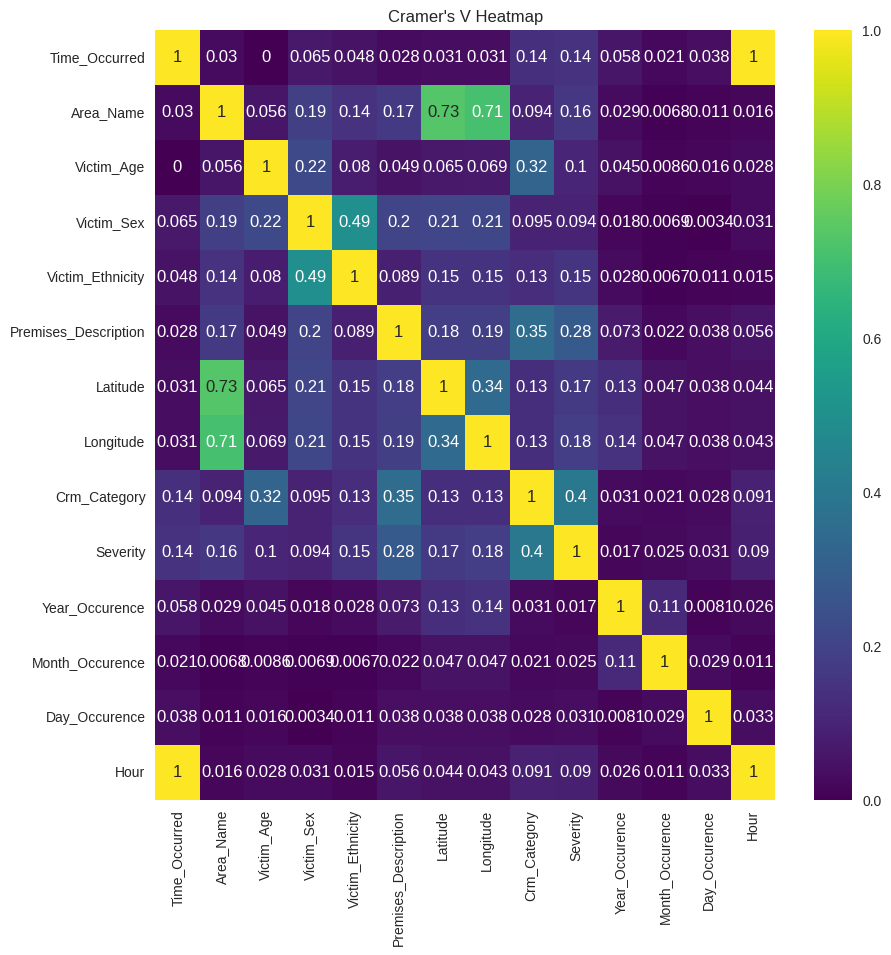

In [ ]:
# # Function to calculate Cramer's V since the attributes in our dataframe are categorical as in, they represent
# # a set of fixed values
# #Since they are categorical, cramers V is a better way for calculating how they relate to one another
from scipy.stats import chi2_contingency


def cramers_correlated_values(confusion_matrix):
    chi2 = chi2_contingency(confusion_matrix)[0]
    n = confusion_matrix.sum()
    phi2 = chi2 / n
    r, k = confusion_matrix.shape
    phi2corr = max(0, phi2 - ((k - 1) * (r - 1)) / (n - 1))
    rcorr = r - ((r - 1) ** 2) / (n - 1)
    kcorr = k - ((k - 1) ** 2) / (n - 1)
    return np.sqrt(phi2corr / min((kcorr - 1), (rcorr - 1)))

# Compute Cramer's V matrix
cramers_matrix = np.zeros((len(dataframe.columns), len(dataframe.columns)))
for i in range(len(dataframe.columns)):
    for j in range(len(dataframe.columns)):
        confusion_matrix = pd.crosstab(dataframe.iloc[:, i], dataframe.iloc[:, j]).values
        cramers_matrix[i, j] = cramers_correlated_values(confusion_matrix)

# Plot a heatmap
plt.figure(figsize=(10, 10))
sns.heatmap(cramers_matrix, annot=True, cmap='viridis', xticklabels=dataframe.columns, yticklabels=dataframe.columns)
plt.title("Cramer's V Heatmap")
plt.show()

In [ ]:
dataframe.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 627912 entries, 0 to 834319
Data columns (total 14 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   Time_Occurred         627912 non-null  int64  
 1   Area_Name             627912 non-null  object 
 2   Victim_Age            627912 non-null  int64  
 3   Victim_Sex            627912 non-null  object 
 4   Victim_Ethnicity      627912 non-null  object 
 5   Premises_Description  627912 non-null  object 
 6   Latitude              627912 non-null  float64
 7   Longitude             627912 non-null  float64
 8   Crm_Category          627912 non-null  object 
 9   Severity              627912 non-null  object 
 10  Year_Occurence        627912 non-null  int64  
 11  Month_Occurence       627912 non-null  object 
 12  Day_Occurence         627912 non-null  object 
 13  Hour                  627912 non-null  int64  
dtypes: float64(2), int64(4), object(8)
memory usage: 71.

In [ ]:
from sklearn.preprocessing import LabelEncoder
encoder = LabelEncoder()
#using label encoder to encode columns of type object and category
columns_to_encode = [col for col in dataframe.columns if dataframe[col].dtype == 'object' or dataframe[col].dtype == 'category']
for col in columns_to_encode:
  dataframe[col] = encoder.fit_transform(dataframe[col])

In [ ]:
#We will consider columns who's association > 0.01
df_new = dataframe.drop(columns = ['Month_Occurence', 'Day_Occurence', 'Area_Name', 'Severity'])

In [ ]:
from sklearn.model_selection import train_test_split
#from imblearn.over_sampling import RandomOverSampler
X = df_new.drop(columns = ['Crm_Category'])
y = df_new['Crm_Category']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# sampler = RandomOverSampler(random_state=42)
# X_resampled, y_resampled = sampler.fit_resample(X_train, y_train)

In [ ]:
from sklearn.ensemble import RandomForestClassifier
#using a random forest classifier with 100 trees
model = RandomForestClassifier(random_state=42, n_estimators=100)
model.fit(X_train, y_train)

RandomForestClassifier(random_state=42)

In [ ]:
from sklearn.metrics import accuracy_score
y_train_pred = model.predict(X_train)
y_test_pred = model.predict(X_test)

print('Training Accuracy: ', accuracy_score(y_train, y_train_pred)
      ,'Testing Accuracy: ', accuracy_score(y_test, y_test_pred))

Training Accuracy:  0.999078577961405 Testing Accuracy:  0.5322709078747598


In [ ]:
feature_importance = pd.DataFrame(list(zip(X_train.columns, model.feature_importances_)))
feature_importance.sort_values(1, ascending=False).head()

#so we can extract area_name from latitude/longitude or distance from city center in order to compute the type of crime
#since it is an important feature
#feature importance on the basis of random forest

,0,1
5,Latitude,0.190327
6,Longitude,0.189593
1,Victim_Age,0.164031
4,Premises_Description,0.149494
0,Time_Occurred,0.138820


In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test, y_test_pred))
#print out the classification report

              precision    recall  f1-score   support

           0       0.59      0.56      0.57      1968
           1       0.75      0.36      0.48     16849
           2       0.50      0.49      0.50     51879
           3       0.56      0.62      0.59     62471
           4       0.50      0.52      0.51     55207

    accuracy                           0.53    188374
   macro avg       0.58      0.51      0.53    188374
weighted avg       0.54      0.53      0.53    188374



In [ ]:
X_new = dataframe[['Latitude', 'Longitude', 'Time_Occurred', 'Victim_Age', 'Premises_Description']]
X_train, X_test, y_train, y_test = train_test_split(X_new, y, test_size=0.3, random_state=42)

In [ ]:
model1 = RandomForestClassifier(random_state=42, n_estimators=100)
model1.fit(X_train, y_train)
#fit random forest on important features

RandomForestClassifier(random_state=42)

In [ ]:
y_train_pred = model1.predict(X_train)
y_test_pred = model1.predict(X_test)

print('Training Accuracy: ', accuracy_score(y_train, y_train_pred)
      ,'Testing Accuracy: ', accuracy_score(y_test, y_test_pred))

Training Accuracy:  0.9984233445117373 Testing Accuracy:  0.52593245352331


In [ ]:
from xgboost import XGBClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline

# Create and train the XGBoost classifier with a standard scaler
model2 = make_pipeline(XGBClassifier(random_state=42))
model2.fit(X_train, y_train)

# Make predictions on the test set
y_pred = model2.predict(X_test)

# # Convert predictions back to original labels for evaluation
# y_pred_original = encoder.inverse_transform(y_pred)
# y_test_original = encoder.inverse_transform(y_test)

# Evaluate the model
y_train_pred = model2.predict(X_train)
y_test_pred = model2.predict(X_test)

print('Training Accuracy: ', accuracy_score(y_train, y_train_pred)
      ,'Testing Accuracy: ', accuracy_score(y_test, y_test_pred))

print("Classification Report:")
print(classification_report(y_test, y_test_pred))

Training Accuracy:  0.551308419294805 Testing Accuracy:  0.5362258061091233
Classification Report:
              precision    recall  f1-score   support

           0       0.58      0.57      0.58      1968
           1       0.80      0.35      0.48     16849
           2       0.50      0.53      0.51     51879
           3       0.56      0.62      0.59     62471
           4       0.50      0.51      0.51     55207

    accuracy                           0.54    188374
   macro avg       0.59      0.52      0.53    188374
weighted avg       0.55      0.54      0.53    188374



In [ ]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 439538 entries, 754936 to 160727
Data columns (total 5 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   Latitude              439538 non-null  float64
 1   Longitude             439538 non-null  float64
 2   Time_Occurred         439538 non-null  int64  
 3   Victim_Age            439538 non-null  int64  
 4   Premises_Description  439538 non-null  int64  
dtypes: float64(2), int64(3)
memory usage: 20.1 MB


In [ ]:
from keras.utils import to_categorical
from keras.models import Sequential
from keras.layers import LSTM, Dense
#define a list of predictors
predictors = ['Latitude', 'Longitude', 'Time_Occurred', 'Victim_Age', 'Premises_Description']
target = ['Crm_Category']

#encode the predictors
dataframe[predictors] = dataframe[predictors].apply(encoder.fit_transform)
y = encoder.fit_transform(dataframe[target].values)
#change y to categorical
y = to_categorical(y)
X_train, X_test, y_train, y_test = train_test_split(dataframe[predictors], y, test_size=0.2, random_state=42)
#scale predictors
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

X_train = X_train.reshape(X_train.shape[0], 1, X_train.shape[1])
X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
#train a neural network on the data for 20 epochs with the adam optimizer.
model = Sequential()
model.add(LSTM(50, activation='relu', input_shape=(1, X_train.shape[2])))
model.add(Dense(50, activation='relu'))
model.add(Dense(y.shape[1], activation='softmax'))

model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

model.fit(X_train, y_train, epochs=20, batch_size=32, validation_split=0.1)

loss, accuracy = model.evaluate(X_test, y_test)
print(f"Test accuracy: {accuracy * 100:.2f}%")


Epoch 1/20
14128/14128 [==============================] - 30s 2ms/step - loss: 1.2191 - accuracy: 0.4316 - val_loss: 1.1920 - val_accuracy: 0.4501
Epoch 2/20
14128/14128 [==============================] - 30s 2ms/step - loss: 1.1730 - accuracy: 0.4739 - val_loss: 1.1596 - val_accuracy: 0.4803
Epoch 3/20
14128/14128 [==============================] - 41s 3ms/step - loss: 1.1582 - accuracy: 0.4820 - val_loss: 1.1526 - val_accuracy: 0.4818
Epoch 4/20
14128/14128 [==============================] - 42s 3ms/step - loss: 1.1507 - accuracy: 0.4861 - val_loss: 1.1514 - val_accuracy: 0.4835
Epoch 5/20
14128/14128 [==============================] - 34s 2ms/step - loss: 1.1466 - accuracy: 0.4891 - val_loss: 1.1447 - val_accuracy: 0.4888
Epoch 6/20
14128/14128 [==============================] - 37s 3ms/step - loss: 1.1436 - accuracy: 0.4910 - val_loss: 1.1406 - val_accuracy: 0.4915
Epoch 7/20
14128/14128 [==============================] - 43s 3ms/step - loss: 1.1413 - accuracy: 0.4923 - val_loss: 1

## **TRYING TO INCORPORATE CHANGES SUGGESTED DURING THE PROJECT PRESENTATION**

## First approach

In [ ]:
import pandas as pd
from sklearn.cluster import KMeans


# Ensure time data is in the correct format
def format_time(time):
    time_str = str(time).zfill(4)  # Pad with zeros to ensure it's at least 4 digits
    return pd.to_datetime(time_str, format='%H%M').hour

data['Time_Occurred'] = data['Time_Occurred'].apply(format_time)

# Define the function to assign time quarters
def get_time_quarter(hour):
    if 1 <= hour < 7:
        return '1am to 6am'
    elif 7 <= hour < 13:
        return '7am to 12pm'
    elif 13 <= hour < 19:
        return '1pm to 6pm'
    else:
        return '7pm to 12am'

data['Time_Quarter'] = data['Time_Occurred'].apply(get_time_quarter)

# One-hot encoding for time quarters
time_quarters_encoded = pd.get_dummies(data['Time_Quarter'])
data = pd.concat([data, time_quarters_encoded], axis=1)

# Selecting columns for clustering
columns_for_clustering = ['Latitude', 'Longitude', '1am to 6am', '7am to 12pm', '1pm to 6pm', '7pm to 12am']
cluster_data = data[columns_for_clustering]

# Perform KMeans clustering
kmeans = KMeans(n_clusters=5, random_state=0)
data['Cluster'] = kmeans.fit_predict(cluster_data)

# Determine 'Crime' or 'No Crime' for each cluster
cluster_counts = data['Cluster'].value_counts()
average_count = cluster_counts.mean()

def crime_status(cluster):
    return 'Crime' if cluster_counts[cluster] > average_count else 'No Crime'

data['Crime_Status'] = data['Cluster'].apply(crime_status)

# Display the results
data[['Time_Occurred', 'Time_Quarter', 'Cluster', 'Crime_Status']].head()
data


,Report_Number,Date_Reported,Date_Occurred,Time_Occurred,Area_Name,Crime_Code,Crime_Description,Victim_Age,Victim_Sex,Victim_Ethnicity,...,Month_Occurence,Day_Occurence,Days Between,Time_Quarter,1am to 6am,1pm to 6pm,7am to 12pm,7pm to 12am,Cluster,Crime_Status
0,10304468,2020-01-08,2020-01-08,22,Southwest,624,BATTERY - SIMPLE ASSAULT,36,Female,Black,...,January,Wednesday,0,7pm to 12am,0,0,0,1,3,Crime
1,190101086,2020-01-02,2020-01-01,3,Central,624,BATTERY - SIMPLE ASSAULT,25,Male,LatinX,...,January,Wednesday,1,1am to 6am,1,0,0,0,4,No Crime
3,191501505,2020-01-01,2020-01-01,17,N Hollywood,745,VANDALISM - MISDEAMEANOR ($399 OR UNDER),76,Female,White,...,January,Wednesday,0,1pm to 6pm,0,1,0,0,0,Crime
4,191921269,2020-01-01,2020-01-01,4,Mission,740,"VANDALISM - FELONY ($400 & OVER, ALL CHURCH VA...",31,Unknown,Unknown,...,January,Wednesday,0,1am to 6am,1,0,0,0,4,No Crime
5,200100501,2020-01-02,2020-01-01,0,Central,121,"RAPE, FORCIBLE",25,Female,LatinX,...,January,Wednesday,1,7pm to 12am,0,0,0,1,3,Crime
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
834315,231604807,2023-01-27,2023-01-26,18,Foothill,740,"VANDALISM - FELONY ($400 & OVER, ALL CHURCH VA...",23,Male,LatinX,...,January,Thursday,1,1pm to 6pm,0,1,0,0,0,Crime
834316,231606525,2023-03-22,2023-03-22,10,Foothill,230,"ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT",25,Female,LatinX,...,March,Wednesday,0,7am to 12pm,0,0,1,0,2,Crime
834317,231210064,2023-04-12,2023-04-12,16,77th Street,230,"ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT",29,Male,Black,...,April,Wednesday,0,1pm to 6pm,0,1,0,0,0,Crime
834318,230115220,2023-07-02,2023-07-01,0,Central,352,PICKPOCKET,24,Female,LatinX,...,July,Saturday,1,7pm to 12am,0,0,0,1,3,Crime


In [ ]:
data['Crime_Status'].value_counts()

Crime       541322
No Crime     86590
Name: Crime_Status, dtype: int64

In [ ]:
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import classification_report, accuracy_score


# Convert categorical variable 'Crm_Category' into numerical values
label_encoder = LabelEncoder()
data['Crm_Category_Encoded'] = label_encoder.fit_transform(data['Crm_Category'])

# Splitting the dataset
X = data[['Crm_Category_Encoded']]  # Features with encoded 'Crm_Category'
y = data['Crime_Status']            # Target variable

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Manually setting class weights
class_weights = { 'Crime': 1, 'No Crime': 5 }  # Adjust these values based on your dataset

clf = RandomForestClassifier(n_estimators=100, class_weight=class_weights)

# Training the model
clf.fit(X_train, y_train)

# Predicting for the test set
y_pred = clf.predict(X_test)

# Model Evaluation
print(classification_report(y_test, y_pred))
print("Accuracy:", accuracy_score(y_test, y_pred))


              precision    recall  f1-score   support

       Crime       0.86      1.00      0.93    162454
    No Crime       0.00      0.00      0.00     25920

    accuracy                           0.86    188374
   macro avg       0.43      0.50      0.46    188374
weighted avg       0.74      0.86      0.80    188374

Accuracy: 0.8624013929735526


In [ ]:
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score
from sklearn.model_selection import train_test_split

# Splitting the dataset
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Creating a pipeline that first oversamples the data, then applies the Random Forest classifier
clf = Pipeline([
    ('smote', SMOTE()),
    ('classifier', RandomForestClassifier(n_estimators=100))
])

# Training the model
clf.fit(X_train, y_train)

# Predicting for the test set
y_pred = clf.predict(X_test)

# Model Evaluation
print(classification_report(y_test, y_pred))
print("Accuracy:", accuracy_score(y_test, y_pred))
#In your case, it seems like the model is struggling to balance the sensitivity to the 'No Crime' class with the overall accuracy. Fine-tuning the balance between over-sampling the minority class and preserving the characteristics of the majority class is key here.


              precision    recall  f1-score   support

       Crime       0.89      0.29      0.44    162454
    No Crime       0.15      0.76      0.25     25920

    accuracy                           0.36    188374
   macro avg       0.52      0.53      0.34    188374
weighted avg       0.78      0.36      0.41    188374

Accuracy: 0.3584093346215507


## Second Approach

In [ ]:
new_dataframe = df_new.copy()

In [ ]:
new_dataframe['Year_Occurence'].value_counts()

2022    178351
2021    158911
2020    151143
2023    139507
Name: Year_Occurence, dtype: int64

In [ ]:
def format_time(time):
    time_str = str(time).zfill(4)  # Pad with zeros to ensure it's at least 4 digits
    return pd.to_datetime(time_str, format='%H%M')

new_dataframe['Time_Format'] = new_dataframe['Time_Occurred'].apply(format_time)

In [ ]:
new_dataframe['Time_Format'] = new_dataframe['Time_Format'].dt.strftime('%H:%M')

In [ ]:
new_dataframe.head()

,Time_Occurred,Victim_Age,Victim_Sex,Victim_Ethnicity,Premises_Description,Latitude,Longitude,Crm_Category,Year_Occurence,Hour,Time_Format
0,2230,36,0,1,254,34.0141,-118.2978,4,2020,22,22:30
1,330,25,1,10,253,34.0459,-118.2545,4,2020,3,03:30
3,1730,76,0,18,206,34.1685,-118.4019,1,2020,17,17:30
4,415,31,2,16,23,34.2198,-118.4468,1,2020,4,04:15
5,30,25,0,10,212,34.0452,-118.2534,4,2020,0,00:30


In [ ]:
new_dataframe['Time_Format'] = pd.to_datetime(new_dataframe['Time_Format'])
bins = pd.date_range('00:00', '23:59', freq='30T')
labels = [f'{start.strftime("%I:%M %p")} - {end.strftime("%I:%M %p")}' for start, end in zip(bins, bins[1:])]
new_dataframe['Time Range'] = pd.cut(new_dataframe['Time_Format'], bins = bins, labels = labels)
#creating bins for 30 mins in a 24 hour time scale

In [ ]:
new_dataframe.head()

,Time_Occurred,Victim_Age,Victim_Sex,Victim_Ethnicity,Premises_Description,Latitude,Longitude,Crm_Category,Year_Occurence,Hour,Time_Format,Time Range
0,2230,36,0,1,254,34.0141,-118.2978,4,2020,22,2023-12-22 22:30:00,10:00 PM - 10:30 PM
1,330,25,1,10,253,34.0459,-118.2545,4,2020,3,2023-12-22 03:30:00,03:00 AM - 03:30 AM
3,1730,76,0,18,206,34.1685,-118.4019,1,2020,17,2023-12-22 17:30:00,05:00 PM - 05:30 PM
4,415,31,2,16,23,34.2198,-118.4468,1,2020,4,2023-12-22 04:15:00,04:00 AM - 04:30 AM
5,30,25,0,10,212,34.0452,-118.2534,4,2020,0,2023-12-22 00:30:00,12:00 AM - 12:30 AM


In [ ]:
new_dataframe.drop(columns = ['Hour'], inplace = True)

In [ ]:
new_dataframe['Time Range'].value_counts()

11:30 AM - 12:00 PM    30407
12:00 AM - 12:30 AM    23281
05:30 PM - 06:00 PM    21747
04:30 PM - 05:00 PM    21016
07:30 PM - 08:00 PM    20887
03:30 PM - 04:00 PM    19662
06:30 PM - 07:00 PM    19519
02:30 PM - 03:00 PM    19183
08:30 PM - 09:00 PM    18876
09:30 PM - 10:00 PM    18747
01:30 PM - 02:00 PM    18088
12:30 PM - 01:00 PM    17811
10:30 AM - 11:00 AM    15927
09:30 AM - 10:00 AM    15915
10:30 PM - 11:00 PM    15643
12:00 PM - 12:30 PM    14461
07:30 AM - 08:00 AM    14412
06:00 PM - 06:30 PM    13810
05:00 PM - 05:30 PM    13672
08:30 AM - 09:00 AM    13643
03:00 PM - 03:30 PM    13384
08:00 PM - 08:30 PM    13359
04:00 PM - 04:30 PM    13221
07:00 PM - 07:30 PM    13216
02:00 PM - 02:30 PM    12931
09:00 PM - 09:30 PM    12357
01:00 PM - 01:30 PM    12266
11:00 AM - 11:30 AM    11898
10:00 PM - 10:30 PM    11568
12:30 AM - 01:00 AM    11566
10:00 AM - 10:30 AM    11331
01:30 AM - 02:00 AM    10309
11:00 PM - 11:30 PM     9953
09:00 AM - 09:30 AM     9288
06:30 AM - 07:

In [ ]:
# lat_lon = data[['Latitude', 'Longitude']].copy()
# lat_lon = lat_lon.loc[(lat_lon['Latitude'] != 0) & (lat_lon['Longitude'] != 0)]
# #choose only those latitude and longitude values where the latitude and longitude values
# #are not equal to zero. If zero values are not removed, then the x and y values are
# #plotted only at 0.
# lat_lon.reset_index(drop = True)
# sns.relplot(x = 'Longitude', y = 'Latitude', data = lat_lon)
# plt.title('Occurence of crimes across latitude and longitude')

In [ ]:
# new_dataframe['Time Range'] = encoder.fit_transform(new_dataframe['Time Range'])

In [ ]:
# new_dataframe = new_dataframe[(new_dataframe['Latitude'] != 0) & (new_dataframe['Longitude'] != 0)]
# plt.scatter(x = 'Longitude', y = 'Latitude', c = 'Time Range', data = new_dataframe)

In [ ]:
# all_ranges = pd.date_range('2023-01-01 00:00:00', '2023-01-01 23:59:59', freq='30T')
# labels = [f'{start.strftime("%I:%M %p")} - {end.strftime("%I:%M %p")}' for start, end in zip(all_ranges, all_ranges[1:])] + ['11:30 PM - 12:00 AM']
# labels

In [ ]:
new_dataframe.head()

,Time_Occurred,Victim_Age,Victim_Sex,Victim_Ethnicity,Premises_Description,Latitude,Longitude,Crm_Category,Year_Occurence,Time_Format,Time Range
0,2230,36,0,1,254,34.0141,-118.2978,4,2020,2023-12-22 22:30:00,10:00 PM - 10:30 PM
1,330,25,1,10,253,34.0459,-118.2545,4,2020,2023-12-22 03:30:00,03:00 AM - 03:30 AM
3,1730,76,0,18,206,34.1685,-118.4019,1,2020,2023-12-22 17:30:00,05:00 PM - 05:30 PM
4,415,31,2,16,23,34.2198,-118.4468,1,2020,2023-12-22 04:15:00,04:00 AM - 04:30 AM
5,30,25,0,10,212,34.0452,-118.2534,4,2020,2023-12-22 00:30:00,12:00 AM - 12:30 AM


In [ ]:
new_dataframe['Year_Occurence'].unique()

array([2020, 2021, 2023, 2022])

In [ ]:
new_dataframe = new_dataframe[new_dataframe['Year_Occurence'] == 2023][:1000]
#reduced the dataset to only include 5000 rows  from the year 2023

In [ ]:
new_dataframe.head(20)

,Time_Occurred,Victim_Age,Victim_Sex,Victim_Ethnicity,Premises_Description,Latitude,Longitude,Crm_Category,Year_Occurence,Time_Format,Time Range
337805,1400,33,0,18,254,34.2439,-118.5745,3,2023,2023-12-22 14:00:00,01:30 PM - 02:00 PM
337832,1200,64,0,18,238,34.1762,-118.5188,2,2023,2023-12-22 12:00:00,11:30 AM - 12:00 PM
409186,1930,28,1,18,227,34.0396,-118.2590,3,2023,2023-12-22 19:30:00,07:00 PM - 07:30 PM
409859,1618,30,1,18,254,34.1555,-118.6118,2,2023,2023-12-22 16:18:00,04:00 PM - 04:30 PM
410831,1630,48,1,10,206,34.0396,-118.2726,2,2023,2023-12-22 16:30:00,04:00 PM - 04:30 PM
411189,1,28,1,10,265,34.0509,-118.2937,3,2023,2023-12-22 00:01:00,12:00 AM - 12:30 AM
411688,1600,45,0,18,206,34.0672,-118.3518,2,2023,2023-12-22 16:00:00,03:30 PM - 04:00 PM
411716,1145,31,1,12,116,34.1747,-118.4442,1,2023,2023-12-22 11:45:00,11:30 AM - 12:00 PM
413825,1125,52,1,1,80,34.0480,-118.5269,4,2023,2023-12-22 11:25:00,11:00 AM - 11:30 AM
414323,2200,42,1,12,265,33.9961,-118.4777,3,2023,2023-12-22 22:00:00,09:30 PM - 10:00 PM


In [ ]:
changed_df = new_dataframe.groupby(['Latitude', 'Longitude', 'Time Range']).size().reset_index(name = 'crime count')
changed_df['crime count'].value_counts()

0    25960493
1         988
2           3
Name: crime count, dtype: int64

In [ ]:
changed_df['Occurrence of Crime'] = np.where(changed_df['crime count'] == 0, 'No', 'Yes')
changed_df.head()
#when crime count = 0, then occurence of crime is "No" else it is "Yes"

,Latitude,Longitude,Time Range,crime count,Occurrence of Crime
0,33.7161,-118.6555,12:00 AM - 12:30 AM,0,No
1,33.7161,-118.6555,12:30 AM - 01:00 AM,0,No
2,33.7161,-118.6555,01:00 AM - 01:30 AM,0,No
3,33.7161,-118.6555,01:30 AM - 02:00 AM,0,No
4,33.7161,-118.6555,02:00 AM - 02:30 AM,0,No


In [ ]:
# i exported the data into a csv file and then manipulated the file on jupyter notebook
#this is because, the data file is ~1GB

# import pandas as pd
# changed_df.to_csv('output_file.csv', index=False)

In [ ]:
#Just to balance the dataset, I will select all of the rows where crime count > 0 and a few rows where crime count = 0
#Also, we are doing it for a subset of data. This is because, using every combination of latitude, longitude and time range
#for crime count, would lead to an exponentially large amount of data since there are around 4000 unique values of latitude/longitude (in the decimals)

#crime_count_zero = changed_df[changed_df['crime count'] == 0]
# crime_count_more_than_zero = changed_df[changed_df['crime count'] > 0]

In [ ]:
#continued in the file titled "AML_Project Part 2.ipynb"